# Lane Detection — CULane Dataset
### Fixed & Improved Version — v2

**All fixes from v1 plus:**
- **COORD NORMALISATION** — lane coordinates normalised to [0,1] before MSE; train loss was ~828k due to raw pixel values, now should be ~1–10
- **METRICS BUG** — `mean_iou` was equal to Precision/Recall/F1; now correctly averages IoU of matched pairs
- **TRANSFORMER WARNING** — `batch_first=True` set; forward shapes updated; silences nested-tensor UserWarning
- **THRESH_DIST** — distance threshold converted to normalised space (20/800)

In [49]:
import os, cv2, math, random, time, json
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.amp import autocast
from torch.cuda.amp import GradScaler
from datetime import datetime
import torchvision.models as models
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import matplotlib.pyplot as plt

torch.backends.cudnn.benchmark = False
torch.backends.cudnn.allow_tf32   = True   # ← ADD THIS
torch.backends.cuda.matmul.allow_tf32 = True 

torch.manual_seed(42)
np.random.seed(42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device : {device}")
if device.type == "cuda":
    print(f"GPU    : {torch.cuda.get_device_name(0)}")

Device : cuda
GPU    : Tesla T4


In [50]:
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"   # ← ADD
os.environ["PYTORCH_ALLOC_CONF"] = "expandable_segments:True"  # already there

In [51]:
import os, shutil

os.environ["PYTORCH_ALLOC_CONF"] = "expandable_segments:True"

CKPT_SRC = "/kaggle/input/datasets/shivakrishnacherala/lstrbestmodel/lstr_best (20).pth"
CKPT_DST = "/kaggle/working/lstr_checkpoint_latest.pth"

if os.path.exists(CKPT_SRC):
    shutil.copy(CKPT_SRC, CKPT_DST)
    print(f"✓ Best checkpoint copied → {CKPT_DST}")
else:
    print(f"✗ Not found: {CKPT_SRC}")

✓ Best checkpoint copied → /kaggle/working/lstr_checkpoint_latest.pth


In [52]:
import torch
if os.path.exists("/kaggle/working/lstr_checkpoint_latest.pth"):
    
    ckpt = torch.load("/kaggle/working/lstr_checkpoint_latest.pth", map_location="cpu")
    print(f"Resuming from epoch : {ckpt['epoch']}")
    print(f"Best F1 so far      : {ckpt['best_score']:.4f}")
    print(f"ES counter          : {ckpt['es_counter']}")
else:
    print("no check points")

Resuming from epoch : 185
Best F1 so far      : 0.7083
ES counter          : 4


In [53]:
base_path = "/kaggle/input/datasets/manideep1108/culane/CULane"

video_split = {
    "driver_100_30frame": {"train": 41,  "val": 4,  "test": 5},
    "driver_161_90frame": {"train": 100, "val": 12, "test": 13},
    "driver_182_30frame": {"train": 36,  "val": 4,  "test": 4},
    "driver_193_90frame": {"train": 110, "val": 13, "test": 14},
    "driver_23_30frame":  {"train": 101, "val": 10, "test": 15},
    "driver_37_30frame":  {"train": 8,   "val": 2,  "test":  2},
}

train_videos, val_videos, test_videos = [], [], []

for driver, splits in video_split.items():
    driver_path = os.path.join(base_path, driver, driver)
    videos = sorted([
        v for v in os.listdir(driver_path)
        if os.path.isdir(os.path.join(driver_path, v))
    ])
    n_tr, n_val, n_te = splits["train"], splits["val"], splits["test"]
    train_v = videos[:n_tr]
    val_v   = videos[n_tr : n_tr + n_val]
    test_v  = videos[n_tr + n_val : n_tr + n_val + n_te]

    train_videos += [os.path.join(driver, driver, v) for v in train_v]
    val_videos   += [os.path.join(driver, driver, v) for v in val_v]
    test_videos  += [os.path.join(driver, driver, v) for v in test_v]

print(f"Train videos : {len(train_videos)}")
print(f"Val   videos : {len(val_videos)}")
print(f"Test  videos : {len(test_videos)}")


Train videos : 396
Val   videos : 45
Test  videos : 53


In [ ]:
def build_sample_list(video_list, base_path, max_samples=None):
    """
    Scans each video folder → collects (img_path, anno_path, exist_flags).
    CULane annotation: each .lines.txt has up to 4 lanes as x y pairs per line.
    exist_flags come from a sidecar file OR are inferred from non-empty lanes.
    """
    samples = []  
    for rel_video in tqdm(video_list, desc="Scanning videos", ncols=80):
        video_dir = os.path.join(base_path, rel_video)
        if not os.path.isdir(video_dir):
            continue

        for fname in sorted(os.listdir(video_dir)):
            if not fname.endswith(".jpg"):
                continue

            img_path  = os.path.join(video_dir, fname)
            anno_path = img_path.replace(".jpg", ".lines.txt")

            # Infer existence flags from annotation
            exist_flags = [0, 0, 0, 0]
            if os.path.exists(anno_path):
                with open(anno_path) as f:
                    lines = [l.strip() for l in f if l.strip()]
                for i, line in enumerate(lines[:4]):
                    pts = list(map(float, line.split()))
                    if len(pts) >= 4:          # at least 2 (x,y) pairs
                        exist_flags[i] = 1

            samples.append((img_path, anno_path, exist_flags))

    if max_samples:
        random.shuffle(samples)
        samples = samples[:max_samples]

    return samples


# ── Build lists ──────────────────────────────────────────────────────────────
# Set max_samples to a small number (e.g. 5000) for quick experiments,
# or None to use everything.
MAX_TRAIN = None  # ← change to e.g. 8000 for a fast subset run
MAX_VAL   = None

train_samples = build_sample_list(train_videos, base_path, max_samples=MAX_TRAIN)
val_samples   = build_sample_list(val_videos,   base_path, max_samples=MAX_VAL)
test_samples  = build_sample_list(test_videos,  base_path)

print(f"\nTotal train frames : {len(train_samples)}")
print(f"Total val   frames : {len(val_samples)}")
print(f"Total test  frames : {len(test_samples)}")

# ── Quick sanity check on one sample ─────────────────────────────────────────
img_p, ann_p, flags = train_samples[0]
print(f"\nSample image : {img_p}")
print(f"Annotation   : {ann_p}  exists={os.path.exists(ann_p)}")
print(f"Exist flags  : {flags}")

Scanning videos: 100%|██████████████████████████| 53/53 [00:06<00:00,  7.85it/s]



Total train frames : 40348
Total val   frames : 4891
Total test  frames : 6004

Sample image : /kaggle/input/datasets/manideep1108/culane/CULane/driver_100_30frame/driver_100_30frame/05250325_0272.MP4/00000.jpg
Annotation   : /kaggle/input/datasets/manideep1108/culane/CULane/driver_100_30frame/driver_100_30frame/05250325_0272.MP4/00000.lines.txt  exists=True
Exist flags  : [0, 0, 0, 0]


In [ ]:
class Config:
    BASE_PATH      = base_path
    ORIG_H, ORIG_W = 590, 1640
    CROP_TOP       = 160
    IMG_H,  IMG_W  = 368, 640
    MAX_LANES      = 4
    POLY_DEGREE    = 3
    D_MODEL        = 256      
    NHEAD          = 8
    NUM_ENC_LAYERS = 2        
    NUM_DEC_LAYERS = 2        
    DIM_FF         = 512      
    DROPOUT        = 0.1      
    BATCH_SIZE     = 128
    EPOCHS         = 300
    LR             = 1.5e-4
    WEIGHT_DECAY   = 2e-4
    MAX_GRAD_NORM  = 0.5
    W_EXIST        = 1.0
    W_POLY         = 5.0      
    W_ANCHOR       = 1.0      
    W_Y_RANGE      = 1.0
    ES_PATIENCE    = 40
    ES_MIN_DELTA   = 1e-4
    THRESHOLD      = 0.45
    USE_AMP        = True
    POLY_Y_MIN     = CROP_TOP / ORIG_H
    POLY_Y_MAX     = 1.00
    CKPT_DIR       = "/kaggle/working"
    CKPT_EVERY     = 5

cfg = Config()
print(f"Config ready ✓")
print(f"  LR={cfg.LR}  Batch={cfg.BATCH_SIZE}  Epochs={cfg.EPOCHS}  D_MODEL={cfg.D_MODEL}")

Config ready ✓
  LR=0.00015  Batch=128  Epochs=300  D_MODEL=256


In [56]:
#cell 8
class CULaneDataset(Dataset):
    def __init__(self, samples, cfg, split="train"):
        self.samples   = samples
        self.cfg       = cfg
        self.split     = split
        self.flip_prob = 0.5 if split == "train" else 0.0

        kp_params = A.KeypointParams(
            format='xy',
            remove_invisible=True,
            angle_in_degrees=True
        )

        if split == "train":
            self.transform = A.Compose([
                A.Resize(cfg.IMG_H, cfg.IMG_W),
                A.Perspective(scale=(0.03, 0.07), p=0.4),
                A.ShiftScaleRotate(shift_limit=0.04, scale_limit=0.1,
                           rotate_limit=4, border_mode=0, p=0.5),
                A.RandomBrightnessContrast(brightness_limit=0.4,
                                   contrast_limit=0.4, p=0.5),
                A.HueSaturationValue(hue_shift_limit=20,
                             sat_shift_limit=40, p=0.4),
                A.GaussNoise(std_range=(10/255, 80/255), p=0.3),
                A.MotionBlur(blur_limit=7, p=0.3),
                A.RandomShadow(p=0.3),
                A.RandomFog(fog_coef_range=(0.1, 0.3), p=0.2),
                A.CoarseDropout(
                    num_holes_range=(1, 8),
                    hole_height_range=(8, 32),
                    hole_width_range=(8, 32), p=0.2),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                    std =(0.229, 0.224, 0.225)),
                ToTensorV2(),
            ], keypoint_params=kp_params)
        else:
            self.transform = A.Compose([
                A.Resize(cfg.IMG_H, cfg.IMG_W),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                        std=(0.229, 0.224, 0.225)),
                ToTensorV2(),
            ], keypoint_params=kp_params)

    def _parse_lanes(self, anno_path):
        lanes = []
        if not os.path.exists(anno_path):
            return lanes
        with open(anno_path) as f:
            for line in f:
                pts = list(map(float, line.strip().split()))
                if len(pts) < 4:
                    continue
                xs = np.array(pts[0::2])
                ys = np.array(pts[1::2])
                cropped_H = self.cfg.ORIG_H - self.cfg.CROP_TOP
                ys_shifted = ys - self.cfg.CROP_TOP
                valid = (ys_shifted >= 0) & (ys_shifted <= cropped_H)
                if valid.sum() < 2:
                    continue
                xs = xs[valid] / self.cfg.ORIG_W
                ys = ys_shifted[valid] / cropped_H
                order = np.argsort(ys)
                lanes.append((xs[order], ys[order]))
        return lanes

    def _flip_lanes(self, lanes):
        return [(1.0 - xs, ys) for xs, ys in lanes][::-1]

    def _fit_poly(self, xs, ys, degree):
        if len(xs) <= degree or len(xs) < 2:
            return np.zeros(degree + 1, dtype=np.float32), 0.5, 1.0
        try:
            xs = np.asarray(xs, dtype=np.float64)
            ys = np.asarray(ys, dtype=np.float64)
            if np.any(~np.isfinite(xs)) or np.any(~np.isfinite(ys)):
                return np.zeros(degree + 1, dtype=np.float32), 0.5, 1.0
            if np.ptp(ys) < 1e-6:
                return np.zeros(degree + 1, dtype=np.float32), 0.5, 1.0
            coeffs = np.polyfit(ys, xs, degree).astype(np.float32)
            if not np.all(np.isfinite(coeffs)):
                return np.zeros(degree + 1, dtype=np.float32), 0.5, 1.0
            return coeffs, float(ys.min()), float(ys.max())
        except Exception:
            return np.zeros(degree + 1, dtype=np.float32), 0.5, 1.0

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, anno_path, exist_flags = self.samples[idx]

        img = cv2.imread(img_path)
        if img is None:
            img = np.zeros((self.cfg.ORIG_H, self.cfg.ORIG_W, 3), dtype=np.uint8)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = img[self.cfg.CROP_TOP:, :]

        lanes = self._parse_lanes(anno_path)

        if self.split == "train" and random.random() < self.flip_prob:
            img         = cv2.flip(img, 1)
            lanes       = self._flip_lanes(lanes)
            exist_flags = exist_flags[::-1]

        H_crop = img.shape[0]
        W_img  = img.shape[1]

        all_kps   = []
        lane_lens = []
        for (xs_n, ys_n) in lanes:
            pts = []
            for xp, yp in zip((xs_n * W_img).tolist(), (ys_n * H_crop).tolist()):
                xp = max(0.0, min(xp, W_img  - 1e-3))
                yp = max(0.0, min(yp, H_crop - 1e-3))
                pts.append((xp, yp))
            all_kps.extend(pts)
            lane_lens.append(len(pts))

        transformed = self.transform(image=img, keypoints=all_kps)
        img_t = transformed["image"]
        kps_t = transformed["keypoints"]

        new_lanes = []
        cursor = 0
        for lane_idx, n_pts in enumerate(lane_lens):
            lane_kps = kps_t[cursor:cursor + n_pts]
            cursor  += n_pts
            if len(lane_kps) < 2:
                exist_flags_list = list(exist_flags)
                exist_flags_list[lane_idx] = 0
                exist_flags = exist_flags_list
                new_lanes.append((np.array([]), np.array([])))
                continue
            lx = np.array([p[0] for p in lane_kps]) / self.cfg.IMG_W
            ly = np.array([p[1] for p in lane_kps]) / self.cfg.IMG_H
            order = np.argsort(ly)
            new_lanes.append((lx[order], ly[order]))

        MAX      = self.cfg.MAX_LANES
        polys    = np.zeros((MAX, self.cfg.POLY_DEGREE + 1), dtype=np.float32)
        y_starts = np.zeros(MAX, dtype=np.float32)
        y_ends   = np.ones(MAX,  dtype=np.float32)
        exists   = np.array(list(exist_flags), dtype=np.float32)

        for i, (xs, ys) in enumerate(new_lanes[:MAX]):
            if exists[i] > 0 and len(xs) >= 2:
                try:
                    coeffs, y_min, y_max = self._fit_poly(xs, ys, self.cfg.POLY_DEGREE)
                except Exception:
                    exists[i] = 0
                    continue
                if coeffs.sum() == 0 and y_min == 0.5:
                    exists[i] = 0
                    continue
                polys[i]    = coeffs
                y_starts[i] = y_min
                y_ends[i]   = y_max

        return {
            "image":    img_t,
            "polys":    torch.from_numpy(polys),
            "exists":   torch.from_numpy(exists),
            "y_starts": torch.tensor(y_starts, dtype=torch.float32),
            "y_ends":   torch.tensor(y_ends,   dtype=torch.float32),
        }

In [57]:
#cell9
train_ds = CULaneDataset(train_samples, cfg, split="train")
val_ds   = CULaneDataset(val_samples,   cfg, split="val")
test_ds  = CULaneDataset(test_samples,  cfg, split="test")

_workers = 4

train_loader = DataLoader(
    train_ds,
    batch_size         = cfg.BATCH_SIZE,
    shuffle            = True,
    num_workers        = _workers,
    pin_memory         = True,
    persistent_workers = True,
    prefetch_factor    = 4,
    drop_last          = True,
)
val_loader = DataLoader(
    val_ds,
    batch_size         = cfg.BATCH_SIZE * 2,
    shuffle            = False,
    num_workers        = _workers,
    pin_memory         = False,
    persistent_workers = True,
    prefetch_factor    = 4,
)
test_loader = DataLoader(
    test_ds,
    batch_size         = cfg.BATCH_SIZE * 2,
    shuffle            = False,
    num_workers        = _workers,
    pin_memory         = False,
)

print(f"Train batches : {len(train_loader)}")
print(f"Val   batches : {len(val_loader)}")
print(f"Test  batches : {len(test_loader)}")

Train batches : 315
Val   batches : 20
Test  batches : 24


In [58]:
import copy

class LSTRBackbone(nn.Module):
    """
    ResNet-34 backbone with 3-level FPN.
    Fuses layer2 (128ch, stride-8) + layer3 (256ch, stride-16) + layer4 (512ch, stride-32)
    → D_MODEL channels at stride-16 (23×40 tokens for 368×640 input).
    Layer2 contributes fine-grained spatial detail that improves polynomial x-accuracy.
    """
    def __init__(self, cfg):
        super().__init__()
        resnet      = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)
        self.stem   = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool)
        self.layer1 = resnet.layer1   #  64ch at stride-4
        self.layer2 = resnet.layer2   # 128ch at stride-8
        self.layer3 = resnet.layer3   # 256ch at stride-16
        self.layer4 = resnet.layer4   # 512ch at stride-32

        d = cfg.D_MODEL               # 512
        self.proj2 = nn.Conv2d(128, d // 4, 1)   # → 128ch
        self.proj3 = nn.Conv2d(256, d // 4, 1)   # → 128ch
        self.proj4 = nn.Conv2d(512, d // 4, 1)   # → 128ch

        # Fuse 3×(d//4) → d channels; BN+ReLU stabilises the merged features
        self.fuse = nn.Sequential(
            nn.Conv2d(3 * (d // 4), d, 1),
            nn.BatchNorm2d(d),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        x  = self.stem(x)
        x  = self.layer1(x)
        c2 = self.layer2(x)   # 128ch at stride-8  (46×80 for 368×640)
        c3 = self.layer3(c2)  # 256ch at stride-16 (23×40)
        c4 = self.layer4(c3)  # 512ch at stride-32 (12×20)

        p2 = self.proj2(c2)   # (d//4)ch at stride-8
        p3 = self.proj3(c3)   # (d//4)ch at stride-16
        p4 = self.proj4(c4)   # (d//4)ch at stride-32

        # Align everything to stride-16 (p3's spatial size)
        p4_up = F.interpolate(p4, size=p3.shape[2:], mode='bilinear', align_corners=False)
        p2_dn = F.interpolate(p2, size=p3.shape[2:], mode='bilinear', align_corners=False)

        return self.fuse(torch.cat([p2_dn, p3, p4_up], dim=1))   # d ch at stride-16


class PositionalEncoding2D(nn.Module):
    def __init__(self, d_model):
        super().__init__()
        self.d_model = d_model

    def forward(self, x):
        B, C, H, W = x.shape
        half  = C // 2
        y_pos = torch.arange(H, device=x.device, dtype=torch.float32)
        x_pos = torch.arange(W, device=x.device, dtype=torch.float32)
        dim_t = torch.arange(half // 2, device=x.device, dtype=torch.float32)
        dim_t = 10000 ** (2 * dim_t / half)
        y_enc = torch.zeros(H, half, device=x.device)
        x_enc = torch.zeros(W, half, device=x.device)
        y_enc[:, 0::2] = torch.sin(y_pos[:, None] / dim_t)
        y_enc[:, 1::2] = torch.cos(y_pos[:, None] / dim_t)
        x_enc[:, 0::2] = torch.sin(x_pos[:, None] / dim_t)
        x_enc[:, 1::2] = torch.cos(x_pos[:, None] / dim_t)
        pos = torch.cat([
            y_enc[:, None, :].expand(H, W, half),
            x_enc[None, :, :].expand(H, W, half),
        ], dim=-1).permute(2, 0, 1)
        return x + pos.unsqueeze(0)


class LSTR(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.backbone = LSTRBackbone(cfg)
        self.pos_enc  = PositionalEncoding2D(cfg.D_MODEL)

        enc_layer = nn.TransformerEncoderLayer(
            d_model=cfg.D_MODEL, nhead=cfg.NHEAD,
            dim_feedforward=cfg.DIM_FF, dropout=cfg.DROPOUT,
            batch_first=True, norm_first=True
        )
        self.encoder = nn.TransformerEncoder(enc_layer,
                                             num_layers=cfg.NUM_ENC_LAYERS)

        self.lane_queries = nn.Embedding(cfg.MAX_LANES, cfg.D_MODEL)

        dec_layer = nn.TransformerDecoderLayer(
            d_model=cfg.D_MODEL, nhead=cfg.NHEAD,
            dim_feedforward=cfg.DIM_FF, dropout=cfg.DROPOUT,
            batch_first=True, norm_first=True
        )
        self.decoder = nn.TransformerDecoder(dec_layer,
                                             num_layers=cfg.NUM_DEC_LAYERS)

        self.exist_head  = nn.Linear(cfg.D_MODEL, 1)
        self.poly_head   = nn.Linear(cfg.D_MODEL, cfg.POLY_DEGREE + 1)
        self.yrange_head = nn.Sequential(
            nn.Linear(cfg.D_MODEL, 128),
            nn.ReLU(),
            nn.Linear(128, 2),
            nn.Sigmoid(),
        )
        self._init_weights()

    def _init_weights(self):
        for name, p in self.named_parameters():
            if 'backbone' in name:
                continue   # never overwrite pretrained backbone
            if p.dim() > 1:
                nn.init.xavier_uniform_(p)

    def forward(self, x):
        B    = x.size(0)
        feat = self.backbone(x)
        feat = self.pos_enc(feat)
        seq  = feat.flatten(2).permute(0, 2, 1)
        mem  = self.encoder(seq)
        q    = self.lane_queries.weight.unsqueeze(0).expand(B, -1, -1)
        out  = self.decoder(q, mem)
        return {
            "exist_logits":  self.exist_head(out).squeeze(-1),
            "poly_preds":    self.poly_head(out),
            "y_range_preds": self.yrange_head(out),
        }


# Smoke test
_m = LSTR(cfg).to(device)
_x = torch.randn(2, 3, cfg.IMG_H, cfg.IMG_W, device=device)
_o = _m(_x)
print(f"exist_logits  : {_o['exist_logits'].shape}")
print(f"poly_preds    : {_o['poly_preds'].shape}")
print(f"y_range_preds : {_o['y_range_preds'].shape}")
print(f"Parameters    : {sum(p.numel() for p in _m.parameters())/1e6:.2f} M")
del _m, _x, _o

exist_logits  : torch.Size([2, 4])
poly_preds    : torch.Size([2, 4, 4])
y_range_preds : torch.Size([2, 4, 2])
Parameters    : 24.06 M


/tmp/ipykernel_56/3535837402.py:85: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(enc_layer,


In [59]:
#cell 11
class LSTRLoss(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.cfg = cfg
        self.bce = nn.BCEWithLogitsLoss()

    def _poly_iou_loss(self, pred_p, gt_p, gt_y_starts, gt_y_ends, mask):
        """Differentiable 30px-band IoU loss — vectorised (no Python loop)."""
        if mask.sum() == 0:
            return torch.tensor(0.0, device=pred_p.device)
        p   = pred_p[mask]       # (N, 4)
        g   = gt_p[mask]         # (N, 4)
        y_s = gt_y_starts[mask]  # (N,)
        y_e = gt_y_ends[mask]    # (N,)

        half_w = 15.0 / 1640.0   # 15px each side = 30px band, normalised
        N      = p.shape[0]

        # Build ys for all lanes at once: (N, 200)
        t  = torch.linspace(0, 1, 200, device=p.device).unsqueeze(0)   # (1, 200)
        ys = y_s.unsqueeze(1) + t * (y_e - y_s).unsqueeze(1)           # (N, 200)

        # Evaluate cubic polynomial in batch: (N, 200)
        pred_xs = (p[:,0:1]*ys**3 + p[:,1:2]*ys**2 + p[:,2:3]*ys + p[:,3:4])
        gt_xs   = (g[:,0:1]*ys**3 + g[:,1:2]*ys**2 + g[:,2:3]*ys + g[:,3:4])

        inter = (torch.min(pred_xs + half_w, gt_xs + half_w)
               - torch.max(pred_xs - half_w, gt_xs - half_w)).clamp(min=0)
        union = (torch.max(pred_xs + half_w, gt_xs + half_w)
               - torch.min(pred_xs - half_w, gt_xs - half_w)).clamp(min=0)

        iou = inter.sum(dim=1) / (union.sum(dim=1) + 1e-6)   # (N,)
        iou = iou.clamp(0.0, 1.0)
        return (1.0 - iou).mean()

    def _anchor_row_loss(self, pred_p, gt_p, gt_y_starts, gt_y_ends, mask):
        """Vectorised L1 loss at 15 fixed y-anchors mirroring CULane evaluation rows."""
        if mask.sum() == 0:
            return torch.tensor(0.0, device=pred_p.device)
        p   = pred_p[mask]       # (N, 4)
        g   = gt_p[mask]         # (N, 4)
        y_s = gt_y_starts[mask]  # (N,)
        y_e = gt_y_ends[mask]    # (N,)

        anchors = torch.linspace(0.3, 1.0, 15, device=pred_p.device)  # (15,)

        # valid_mask: (N, 15) — which anchors fall inside each lane's y-range
        valid_mask = (anchors.unsqueeze(0) >= y_s.unsqueeze(1)) & \
                     (anchors.unsqueeze(0) <= y_e.unsqueeze(1))   # (N, 15)

        if not valid_mask.any():
            return torch.tensor(0.0, device=pred_p.device)

        # Evaluate poly at all 15 anchors for all N lanes: (N, 15)
        a = anchors.unsqueeze(0)   # (1, 15)
        px = p[:,0:1]*a**3 + p[:,1:2]*a**2 + p[:,2:3]*a + p[:,3:4]   # (N, 15)
        gx = g[:,0:1]*a**3 + g[:,1:2]*a**2 + g[:,2:3]*a + g[:,3:4]   # (N, 15)

        loss = F.smooth_l1_loss(px, gx, beta=0.005, reduction='none')  # (N, 15)
        loss = (loss * valid_mask.float()).sum() / (valid_mask.float().sum() + 1e-6)
        return loss

    def _lane_order_loss(self, poly_preds, gt_exists):
        loss  = torch.tensor(0.0, device=poly_preds.device)
        count = 0
        for i in range(self.cfg.MAX_LANES - 1):
            both_exist = gt_exists[:, i].bool() & gt_exists[:, i+1].bool()
            if not both_exist.any():
                continue
            ys     = torch.ones(both_exist.sum(), device=poly_preds.device)
            xi     = poly_preds[both_exist, i]
            xj     = poly_preds[both_exist, i+1]
            xi_val = sum(xi[:, k] * (ys ** (self.cfg.POLY_DEGREE - k))
                         for k in range(self.cfg.POLY_DEGREE + 1))
            xj_val = sum(xj[:, k] * (ys ** (self.cfg.POLY_DEGREE - k))
                         for k in range(self.cfg.POLY_DEGREE + 1))
            loss  += F.relu(xi_val - xj_val + 0.02).mean()
            count += 1
        return loss / max(count, 1)

    def forward(self, preds, targets):
        gt_exists   = targets["exists"]
        gt_polys    = targets["polys"]
        gt_y_starts = targets["y_starts"]
        gt_y_ends   = targets["y_ends"]
        mask        = gt_exists.bool()

        loss_exist  = self.bce(preds["exist_logits"], gt_exists)
        loss_poly   = self._poly_iou_loss(
            preds["poly_preds"], gt_polys, gt_y_starts, gt_y_ends, mask)
        loss_anchor = self._anchor_row_loss(
            preds["poly_preds"], gt_polys, gt_y_starts, gt_y_ends, mask)
        loss_order  = self._lane_order_loss(preds["poly_preds"], gt_exists)

        if mask.sum() > 0:
            pred_yr = preds["y_range_preds"]
            gt_yr   = torch.stack([gt_y_starts, gt_y_ends], dim=-1)
            loss_yr = F.smooth_l1_loss(pred_yr[mask], gt_yr[mask], beta=0.02)
        else:
            loss_yr = torch.tensor(0.0, device=gt_exists.device)

        total = (self.cfg.W_EXIST   * loss_exist
               + self.cfg.W_POLY    * loss_poly
               + self.cfg.W_ANCHOR  * loss_anchor
               + 0.5                * loss_order
               + self.cfg.W_Y_RANGE * loss_yr)

        return {
            "total":       total,
            "exist_loss":  loss_exist.item(),
            "poly_loss":   loss_poly.item(),
            "anchor_loss": loss_anchor.item(),
            "order_loss":  loss_order.item(),
            "yr_loss":     loss_yr.item(),
        }

In [60]:
#cell 12
import os
from datetime import datetime

BEST_PATH   = os.path.join(cfg.CKPT_DIR, "lstr_best.pth")
LATEST_PATH = os.path.join(cfg.CKPT_DIR, "lstr_checkpoint_latest.pth")

def save_checkpoint(model, optimizer, scheduler, epoch,
                    val_metrics, early_stopping, history,
                    is_periodic=False):
    raw = model.module if hasattr(model, 'module') else model
    payload = {
        "epoch":           epoch,
        "model_state":     raw.state_dict(),
        "optimizer_state": optimizer.state_dict(),
        "scheduler_state": scheduler.state_dict(),
        "val_f1":          val_metrics["f1"],
        "best_score":      early_stopping.best_score,
        "es_counter":      early_stopping.counter,
        "history":         history,
        "timestamp":       datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    }

    torch.save(payload, LATEST_PATH)

    if is_periodic:
        snap_path = os.path.join(cfg.CKPT_DIR, f"lstr_epoch{epoch:04d}.pth")
        torch.save(payload, snap_path)
        print(f"  📁 Periodic snapshot → {snap_path}")

    if val_metrics.get("is_best", False):
        torch.save(payload, BEST_PATH)
        print(f"  ✓ Best checkpoint saved  [epoch={epoch}  F1={val_metrics['f1']:.4f}]")


def load_checkpoint(model, optimizer=None, scheduler=None,
                    path="lstr_best.pth"):
    if not os.path.exists(path):
        print(f"  ✗ No checkpoint found at {path}")
        return 0
    ckpt = torch.load(path, map_location=device)
    raw  = model.module if hasattr(model, 'module') else model
    raw.load_state_dict(ckpt["model_state"])
    if optimizer and "optimizer_state" in ckpt:
        optimizer.load_state_dict(ckpt["optimizer_state"])
    if scheduler and "scheduler_state" in ckpt:
        scheduler.load_state_dict(ckpt["scheduler_state"])
    print(f"  ✓ Loaded  epoch={ckpt['epoch']}"
          f"  F1={ckpt['val_f1']:.4f}"
          f"  saved={ckpt.get('timestamp','?')}")
    return ckpt["epoch"]


def resume_training(model, optimizer, scheduler, early_stopping, history,
                    path=None):
    path = path or LATEST_PATH
    if not os.path.exists(path):
        print("  No checkpoint found — starting fresh")
        return 1, history
    ckpt = torch.load(path, map_location=device)
    raw  = model.module if hasattr(model, 'module') else model
    raw.load_state_dict(ckpt["model_state"])
    optimizer.load_state_dict(ckpt["optimizer_state"])
    scheduler.load_state_dict(ckpt["scheduler_state"])
    early_stopping.best_score = ckpt["best_score"]
    early_stopping.counter    = ckpt["es_counter"]
    history                   = ckpt["history"]
    start = ckpt["epoch"] + 1
    print(f"  ✓ Resumed epoch {ckpt['epoch']}  F1={ckpt['best_score']:.4f}  ES={ckpt['es_counter']}")
    return start, history


class EarlyStopping:
    def __init__(self, patience=10, min_delta=1e-4, verbose=True):
        self.patience   = patience
        self.min_delta  = min_delta
        self.verbose    = verbose
        self.best_score = None
        self.counter    = 0
        self.stop       = False

    def __call__(self, val_metrics, model, optimizer,
                 scheduler, epoch, history):
        val_f1   = val_metrics["f1"]
        improved = (self.best_score is None or
                    val_f1 > self.best_score + self.min_delta)
        val_metrics["is_best"] = improved

        is_periodic = (epoch % cfg.CKPT_EVERY == 0)
        save_checkpoint(model, optimizer, scheduler, epoch,
                        val_metrics, self, history,
                        is_periodic=is_periodic)

        if improved:
            self.best_score = val_f1
            self.counter    = 0
        else:
            self.counter += 1
            if self.verbose:
                print(f"  ✗ No improvement  {self.counter}/{self.patience}  "
                      f"(best F1={self.best_score:.4f})")
            if self.counter >= self.patience:
                self.stop = True
                print(f"\n  ⛔ Early stopping at epoch {epoch}")


early_stopping = EarlyStopping(
    patience  = cfg.ES_PATIENCE,
    min_delta = cfg.ES_MIN_DELTA,
    verbose   = True,
)
print("Checkpoint utils + EarlyStopping + Resume ready ✓")
print(f"  Snapshots every {cfg.CKPT_EVERY} epochs → {cfg.CKPT_DIR}/lstr_epochXXXX.pth")

Checkpoint utils + EarlyStopping + Resume ready ✓
  Snapshots every 5 epochs → /kaggle/working/lstr_epochXXXX.pth


In [61]:
model     = LSTR(cfg).to(device)
criterion = LSTRLoss(cfg)

if torch.cuda.device_count() > 1:
    print(f"  Using {torch.cuda.device_count()} GPUs → DataParallel ✓")
    model = nn.DataParallel(model)
else:
    print(f"  Using single GPU")

raw_model       = model.module if hasattr(model, 'module') else model
backbone_params = list(raw_model.backbone.parameters())
head_params     = [p for p in model.parameters()
                   if not any(p is bp for bp in backbone_params)]

optimizer = torch.optim.AdamW([
    {"params": backbone_params, "lr": cfg.LR / 10},  # 2e-5 — gentle backbone
    {"params": head_params,     "lr": cfg.LR},        # 2e-4 — fine-tune heads
], weight_decay=cfg.WEIGHT_DECAY)

# CosineAnnealingLR — resumes cleanly from epoch 63
# CosineAnnealingLR — resumes cleanly from epoch 63

# CosineAnnealingWarmRestarts — restarts every 20 epochs to escape plateau
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer,
    T_0     = 20 * len(train_loader),  # restart every 20 epochs
    T_mult  = 1,
    eta_min = 1e-6,
)

scaler = GradScaler(enabled=cfg.USE_AMP)

print(f"Optimizer  : AdamW  backbone lr={cfg.LR/10:.1e}  head lr={cfg.LR:.1e}")
print(f"Scheduler  : CosineAnnealingWarmRestarts  T_0=20 epochs")
print(f"  LR range = {cfg.LR:.1e} → 1e-6")
print(f"AMP        : {'ON (fp16)' if cfg.USE_AMP else 'OFF'}")
print(f"Params     : {sum(p.numel() for p in model.parameters())/1e6:.2f} M")

  Using 2 GPUs → DataParallel ✓
Optimizer  : AdamW  backbone lr=1.5e-05  head lr=1.5e-04
Scheduler  : CosineAnnealingWarmRestarts  T_0=20 epochs
  LR range = 1.5e-04 → 1e-6
AMP        : ON (fp16)
Params     : 24.06 M


/tmp/ipykernel_56/3535837402.py:85: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(enc_layer,
/tmp/ipykernel_56/3425250992.py:31: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=cfg.USE_AMP)


In [62]:
# Existence-only metric (used for train monitoring)
class LaneMetrics:
    def __init__(self, threshold=0.5):
        self.thr = threshold
        self.reset()

    def reset(self):
        self.tp = self.fp = self.fn = 0

    def update(self, exist_logits, gt_exists):
        preds  = (torch.sigmoid(exist_logits) > self.thr).cpu().numpy().flatten()
        labels = gt_exists.cpu().numpy().flatten().astype(bool)
        preds  = preds.astype(bool)
        self.tp += int(( preds &  labels).sum())
        self.fp += int(( preds & ~labels).sum())
        self.fn += int((~preds &  labels).sum())

    def compute(self):
        precision = self.tp / (self.tp + self.fp + 1e-8)
        recall    = self.tp / (self.tp + self.fn + 1e-8)
        f1        = 2 * precision * recall / (precision + recall + 1e-8)
        return {"precision": float(precision),
                "recall":    float(recall),
                "f1":        float(f1)}


# IoU-based metric (official CULane — used for early stopping)
def poly_to_pixel_pts(coeffs, cfg, y_start=None, y_end=None, num_pts=200):
    y_lo = max(y_start if y_start is not None else 0.0, 0.0)
    y_hi = min(y_end   if y_end   is not None else 1.0, 1.0)
    if y_hi <= y_lo:
        y_lo, y_hi = 0.0, 1.0
    ys    = np.linspace(y_lo, y_hi, num_pts)
    xs    = np.polyval(coeffs, ys)
    valid = (xs >= 0) & (xs <= 1)
    if valid.sum() < 2:
        return []
    cropped_H = cfg.ORIG_H - cfg.CROP_TOP   # 430
    # xs → original pixel x,  ys → pixel y in cropped space + offset back to original
    return list(zip(
        (xs[valid] * cfg.ORIG_W).astype(int),
        (ys[valid] * cropped_H + cfg.CROP_TOP).astype(int)   # ← add offset back
    ))

def culane_iou(pred_pts, gt_pts, width=30, img_h=590, img_w=1640):
    pred_mask = np.zeros((img_h, img_w), dtype=np.uint8)
    gt_mask   = np.zeros((img_h, img_w), dtype=np.uint8)
    if len(pred_pts) >= 2:
        for i in range(len(pred_pts) - 1):
            cv2.line(pred_mask, pred_pts[i], pred_pts[i+1], 1, width)
    if len(gt_pts) >= 2:
        for i in range(len(gt_pts) - 1):
            cv2.line(gt_mask, gt_pts[i], gt_pts[i+1], 1, width)
    inter = (pred_mask & gt_mask).sum()
    union = (pred_mask | gt_mask).sum()
    return inter / (union + 1e-8)


class CULaneMetrics:
    def __init__(self, iou_threshold=0.5, exist_threshold=0.5, cfg=None):
        self.iou_thr   = iou_threshold
        self.exist_thr = exist_threshold
        self.cfg       = cfg
        self.reset()

    def reset(self):
        self.tp = self.fp = self.fn = 0

    def update(self, exist_logits, poly_preds, gt_exists, gt_polys,
               y_range_preds=None, gt_y_starts=None, gt_y_ends=None):
        exist_probs = torch.sigmoid(exist_logits).cpu().numpy()
        poly_np     = poly_preds.cpu().numpy()
        gt_exist_np = gt_exists.cpu().numpy()
        gt_poly_np  = gt_polys.cpu().numpy()
        gty_s_np = gt_y_starts.cpu().numpy() if gt_y_starts is not None else None
        gty_e_np = gt_y_ends.cpu().numpy()   if gt_y_ends   is not None else None

        for b in range(exist_probs.shape[0]):
            for l in range(self.cfg.MAX_LANES):
                pred_e = exist_probs[b, l] > self.exist_thr
                true_e = gt_exist_np[b, l] > 0.5

                if pred_e and true_e:
                    g_ys = float(gty_s_np[b, l]) if gty_s_np is not None else None
                    g_ye = float(gty_e_np[b, l]) if gty_e_np is not None else None

                    # ── KEY FIX ────────────────────────────────────────────────
                    # Use GT y_range for BOTH curves. The old code used predicted
                    # y_range for pred_pts, penalising y_range errors on top of
                    # geometry errors. Now we purely measure polynomial x-accuracy
                    # over the ground-truth lane extent.
                    pred_pts = poly_to_pixel_pts(poly_np[b, l],    self.cfg,
                                                 y_start=g_ys, y_end=g_ye)
                    gt_pts   = poly_to_pixel_pts(gt_poly_np[b, l], self.cfg,
                                                 y_start=g_ys, y_end=g_ye)
                    # ──────────────────────────────────────────────────────────

                    iou = culane_iou(pred_pts, gt_pts)
                    if iou >= self.iou_thr:
                        self.tp += 1
                    else:
                        self.fp += 1
                        self.fn += 1
                elif pred_e and not true_e:
                    self.fp += 1
                elif not pred_e and true_e:
                    self.fn += 1

    def compute(self):
        precision = self.tp / (self.tp + self.fp + 1e-8)
        recall    = self.tp / (self.tp + self.fn + 1e-8)
        f1        = 2 * precision * recall / (precision + recall + 1e-8)
        return {"precision": float(precision),
                "recall":    float(recall),
                "f1":        float(f1)}

In [63]:
# ADD THIS right after the LaneMetrics class in Cell 13

def poly_endpoint_error(poly_preds, poly_gt, exists):
    """Mean x-error at y=1.0 (bottom), only on existing lanes. Lower = better geometry."""
    errs = []
    mask = exists.bool()
    for b in range(poly_preds.shape[0]):
        for l in range(poly_preds.shape[1]):
            if mask[b, l]:
                x_pred = float(np.polyval(poly_preds[b, l].cpu().numpy(), 1.0))
                x_gt   = float(np.polyval(poly_gt[b, l].cpu().numpy(),   1.0))
                errs.append(abs(x_pred - x_gt))
    return float(np.mean(errs)) if errs else 0.0

In [64]:
def train_one_epoch(model, loader, optimizer, scheduler,
                    criterion, scaler, metrics, epoch):
    model.train()
    metrics.reset()
    total_loss = total_exist = total_poly = total_order = 0
    t0 = time.time()
    pbar = tqdm(loader, desc=f"[Epoch {epoch:03d}] Train", ncols=120, leave=True)

    for batch in pbar:
        images   = batch["image"].to(device,    non_blocking=True)
        exists   = batch["exists"].to(device,   non_blocking=True)
        polys    = batch["polys"].to(device,    non_blocking=True)
        y_starts = batch["y_starts"].to(device, non_blocking=True)
        y_ends   = batch["y_ends"].to(device,   non_blocking=True)
        targets  = {"exists": exists, "polys": polys,
                    "y_starts": y_starts, "y_ends": y_ends}

        optimizer.zero_grad(set_to_none=True)

        with autocast("cuda", enabled=cfg.USE_AMP):
            preds  = model(images)
            losses = criterion(preds, targets)

        scaler.scale(losses["total"]).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), cfg.MAX_GRAD_NORM)
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()

        total_loss  += losses["total"].item()
        total_exist += losses["exist_loss"]
        total_poly  += losses["poly_loss"]
        total_order += losses["order_loss"]

        metrics.update(preds["exist_logits"].detach(), exists)

        m = metrics.compute()
        pbar.set_postfix(ordered_dict={
            "loss":  f"{losses['total'].item():.4f}",
            "exist": f"{losses['exist_loss']:.4f}",
            "poly":  f"{losses['poly_loss']:.4f}",
            "order": f"{losses['order_loss']:.4f}",
            "P":     f"{m['precision']:.3f}",
            "R":     f"{m['recall']:.3f}",
            "F1":    f"{m['f1']:.3f}",
        })

    n = len(loader)
    m = metrics.compute()
    return {
        "loss":       total_loss  / n,
        "exist":      total_exist / n,
        "poly":       total_poly  / n,
        "order_loss": total_order / n,
        "time":       time.time() - t0,
        **m,
    }

In [65]:
#cell 17
@torch.no_grad()
def validate(model, loader, criterion, metrics, iou_metrics, epoch,
             full_iou=True):          # ← pass False to skip slow IoU
    model.eval()
    metrics.reset()
    iou_metrics.reset()
    total_loss = total_exist = total_poly = total_epe = 0
    t0 = time.time()
    pbar = tqdm(loader, desc=f"[Epoch {epoch:03d}] Val  ", ncols=120, leave=True)

    for batch in pbar:
        images   = batch["image"].to(device,    non_blocking=True)
        exists   = batch["exists"].to(device,   non_blocking=True)
        polys    = batch["polys"].to(device,    non_blocking=True)
        y_starts = batch["y_starts"].to(device, non_blocking=True)
        y_ends   = batch["y_ends"].to(device,   non_blocking=True)
        targets  = {"exists": exists, "polys": polys,
                    "y_starts": y_starts, "y_ends": y_ends}

        with autocast("cuda", enabled=cfg.USE_AMP):
            preds  = model(images)
            losses = criterion(preds, targets)

        total_loss  += losses["total"].item()
        total_exist += losses["exist_loss"]
        total_poly  += losses["poly_loss"]
        total_epe   += poly_endpoint_error(preds["poly_preds"], polys, exists)

        metrics.update(preds["exist_logits"], exists)

        if full_iou:    # ← only draw masks when needed
            iou_metrics.update(
                preds["exist_logits"], preds["poly_preds"], exists, polys,
                y_range_preds=preds["y_range_preds"],
                gt_y_starts=targets["y_starts"],
                gt_y_ends=targets["y_ends"],
            )

        m = metrics.compute()
        pbar.set_postfix(ordered_dict={
            "val_loss": f"{losses['total'].item():.4f}",
            "P": f"{m['precision']:.3f}", "R": f"{m['recall']:.3f}",
            "F1": f"{m['f1']:.3f}",
        })

    n     = len(loader)
    m     = metrics.compute()
    m_iou = iou_metrics.compute() if full_iou else {"precision": 0, "recall": 0, "f1": 0}
    return {
        "loss":      total_loss  / n,
        "exist":     total_exist / n,
        "poly":      total_poly  / n,
        "epe":       total_epe   / n,
        "time":      time.time() - t0,
        "precision": m_iou["precision"],
        "recall":    m_iou["recall"],
        "f1":        m_iou["f1"],
        "exist_f1":  m["f1"],
    }

In [66]:
import os
os.environ["PYTORCH_ALLOC_CONF"] = "expandable_segments:True"

In [ ]:
train_metrics   = LaneMetrics(cfg.THRESHOLD)
val_metrics_obj = LaneMetrics(cfg.THRESHOLD)
val_metrics_iou = CULaneMetrics(iou_threshold=0.5, exist_threshold=cfg.THRESHOLD, cfg=cfg)

history     = {"train": [], "val": []}
start_epoch = 1

early_stopping = EarlyStopping(patience=cfg.ES_PATIENCE, min_delta=cfg.ES_MIN_DELTA, verbose=True)

if os.path.exists(LATEST_PATH):
    ckpt = torch.load(LATEST_PATH, map_location=device)
    raw  = model.module if hasattr(model, 'module') else model
    raw.load_state_dict(ckpt["model_state"])
    optimizer.load_state_dict(ckpt["optimizer_state"])
    scheduler.load_state_dict(ckpt["scheduler_state"])
    early_stopping.best_score = ckpt["best_score"]   # ← read from checkpoint
    early_stopping.counter    = ckpt["es_counter"]   # ← restore ES state too
    history     = ckpt["history"]
    start_epoch = ckpt["epoch"] + 1
    print(f"  ✓ Resumed from epoch {ckpt['epoch']}  best IoU-F1={ckpt['best_score']:.4f}")
    print(f"  LR={cfg.LR:.1e}  W_POLY={cfg.W_POLY}  ES_PATIENCE={cfg.ES_PATIENCE}")
else:
    print("  No checkpoint found — starting fresh from epoch 1")

DIVIDER = "═" * 90
print(DIVIDER)
print(f"  LSTR | CULane | device={device} | epochs={cfg.EPOCHS} | AMP={cfg.USE_AMP}")
print(f"  {'Resuming from' if start_epoch > 1 else 'Starting at'} epoch {start_epoch}")
print(f"  Target : IoU F1 > 0.70  |  Current best : {ckpt['best_score']:.4f}")
print(DIVIDER)

for epoch in range(start_epoch, cfg.EPOCHS + 1):
    if device.type == "cuda":
        used  = torch.cuda.memory_allocated() / 1e9
        total = torch.cuda.get_device_properties(0).total_memory / 1e9
        print(f"  VRAM : {used:.2f} / {total:.1f} GB")

    t = train_one_epoch(model, train_loader, optimizer, scheduler,
                        criterion, scaler, train_metrics, epoch)
    history["train"].append(t)

    run_iou = True  # always compute IoU — never skip
    v = validate(model, val_loader, criterion,
                 val_metrics_obj, val_metrics_iou, epoch,
                 full_iou=run_iou)
    history["val"].append(v)

    print(f"\n{'─'*90}")
    print(f"  Epoch {epoch:03d}/{cfg.EPOCHS}  |  Train {t['time']:.0f}s  Val {v['time']:.0f}s")
    print(f"  TRAIN  loss={t['loss']:.4f}  exist={t['exist']:.4f}"
          f"  poly={t['poly']:.4f}  order={t['order_loss']:.4f}"
          f"  |  P={t['precision']:.4f}  R={t['recall']:.4f}  F1={t['f1']:.4f}")
    print(f"  VAL    loss={v['loss']:.4f}  exist={v['exist']:.4f}"
          f"  poly={v['poly']:.4f}  epe={v['epe']:.4f}"
          f"  |  P={v['precision']:.4f}  R={v['recall']:.4f}"
          f"  F1(IoU)={v['f1']:.4f}  F1(exist)={v['exist_f1']:.4f}")
    print(f"  Gap to 0.70 target : {0.70 - v['f1']:+.4f}")

    early_stopping(v, model, optimizer, scheduler, epoch, history)
    print(f"{'─'*90}\n")

    if early_stopping.stop:
        print(f"  Final best IoU F1 = {early_stopping.best_score:.4f}")
        break

print(f"\n{DIVIDER}")
print(f"  Training complete  |  Best Val IoU-F1 = {early_stopping.best_score:.4f}")
print(DIVIDER)

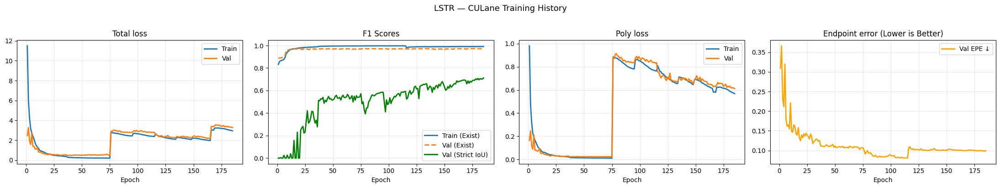

In [67]:
if not history["train"]:
    print("No training history yet — run training first.")
else:
    fig, axes = plt.subplots(1, 4, figsize=(22, 4))
    epochs_ran = range(1, len(history["train"]) + 1)

    # 1. Total Loss
    axes[0].plot(epochs_ran, [e["loss"] for e in history["train"]], label="Train", lw=2)
    axes[0].plot(epochs_ran, [e["loss"] for e in history["val"]],   label="Val",   lw=2)
    axes[0].set_title("Total loss")
    axes[0].set_xlabel("Epoch")
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    # 2. F1 Scores
    axes[1].plot(epochs_ran, [e["f1"] for e in history["train"]], label="Train (Exist)", lw=2)
    axes[1].plot(epochs_ran, [e["exist_f1"] for e in history["val"]], label="Val (Exist)", lw=2, linestyle="--")
    axes[1].plot(epochs_ran, [e["f1"] for e in history["val"]], label="Val (Strict IoU)", lw=2, color="green")
    axes[1].set_title("F1 Scores")
    axes[1].set_xlabel("Epoch")
    axes[1].legend()
    axes[1].grid(alpha=0.3)

    # 3. Poly Loss
    axes[2].plot(epochs_ran, [e["poly"] for e in history["train"]], label="Train", lw=2)
    axes[2].plot(epochs_ran, [e["poly"] for e in history["val"]],   label="Val",   lw=2)
    axes[2].set_title("Poly loss")
    axes[2].set_xlabel("Epoch")
    axes[2].legend()
    axes[2].grid(alpha=0.3)

    # 4. Endpoint Error (Val only)
    axes[3].plot(epochs_ran, [e["epe"] for e in history["val"]], label="Val EPE ↓", lw=2, color="orange")
    axes[3].set_title("Endpoint error (Lower is Better)")
    axes[3].set_xlabel("Epoch")
    axes[3].legend()
    axes[3].grid(alpha=0.3)

    plt.suptitle("LSTR — CULane Training History", fontsize=13, y=1.02)
    plt.tight_layout()
    plt.savefig("training_curves.png", dpi=150, bbox_inches="tight")
    plt.show()

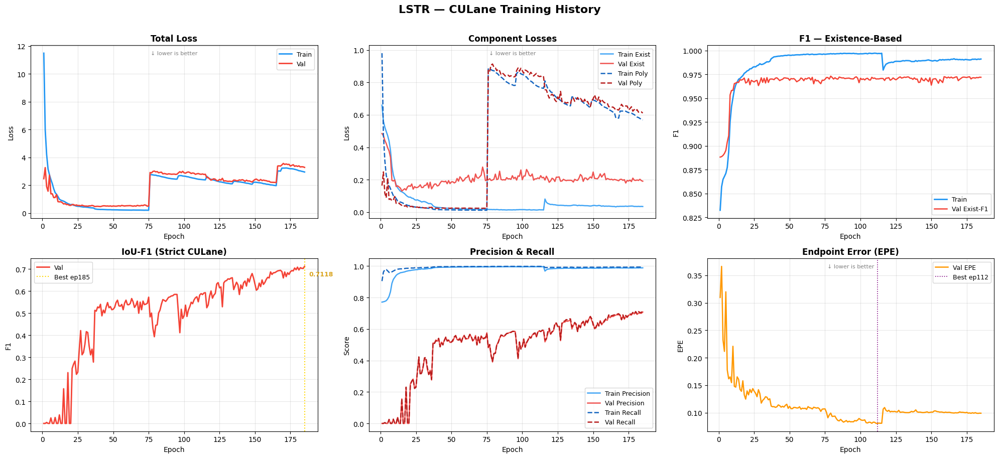

Saved → /kaggle/working/training_history_full.png
  Best Val IoU-F1 = 0.7118  at epoch 185
  Best Val EPE    = 0.0805  at epoch 112


In [68]:
# ── Training History: Loss + F1 + IoU-F1 + EPE ───────────────────────────────

if not history["train"]:
    print("No training history yet — run training first.")
else:
    epochs_ran = list(range(1, len(history["train"]) + 1))
    T = history["train"]
    V = history["val"]

    def _get(records, key):
        vals = [r.get(key) for r in records]
        return vals if all(v is not None for v in vals) else None

    TRAIN_C = "#2196F3"
    VAL_C   = "#F44336"

    fig, axes = plt.subplots(2, 3, figsize=(20, 9))
    fig.suptitle("LSTR — CULane Training History",
                 fontsize=16, fontweight="bold", y=1.01)

    def _plot(ax, title, ylabel, train_vals=None, val_vals=None,
              extra=None, lower_better=False):
        if train_vals:
            ax.plot(epochs_ran, train_vals, color=TRAIN_C, lw=2, label="Train")
        if val_vals:
            ax.plot(epochs_ran, val_vals,   color=VAL_C,   lw=2, label="Val")
        if extra:
            for label, vals, color, ls in extra:
                if vals:
                    ax.plot(epochs_ran, vals, color=color, lw=1.8,
                            linestyle=ls, label=label)
        ax.set_title(title, fontsize=12, fontweight="bold")
        ax.set_xlabel("Epoch", fontsize=10)
        ax.set_ylabel(ylabel, fontsize=10)
        ax.legend(fontsize=9)
        ax.grid(alpha=0.3)
        if lower_better:
            ax.text(0.5, 0.97, "↓ lower is better", transform=ax.transAxes,
                    ha="center", va="top", fontsize=8, color="grey")

    # Row 0
    _plot(axes[0, 0], "Total Loss", "Loss",
          _get(T, "loss"), _get(V, "loss"), lower_better=True)

    _plot(axes[0, 1], "Component Losses", "Loss",
          extra=[
              ("Train Exist", _get(T, "exist"), "#42A5F5", "-"),
              ("Val Exist",   _get(V, "exist"), "#EF5350", "-"),
              ("Train Poly",  _get(T, "poly"),  "#1565C0", "--"),
              ("Val Poly",    _get(V, "poly"),  "#B71C1C", "--"),
          ], lower_better=True)

    _plot(axes[0, 2], "F1 — Existence-Based", "F1",
          _get(T, "f1"),
          extra=[
              ("Val Exist-F1", _get(V, "exist_f1"), VAL_C, "-"),
          ])

    # Row 1
    ax_iou = axes[1, 0]
    vf1 = _get(V, "f1")
    _plot(ax_iou, "IoU-F1 (Strict CULane)", "F1", val_vals=vf1)
    if vf1:
        best_ep  = epochs_ran[vf1.index(max(vf1))]
        best_val = max(vf1)
        ax_iou.axvline(best_ep, color="gold", lw=1.5, linestyle=":",
                       label=f"Best ep{best_ep}")
        ax_iou.annotate(f"{best_val:.4f}",
                        xy=(best_ep, best_val),
                        xytext=(6, -14), textcoords="offset points",
                        fontsize=9, color="goldenrod", fontweight="bold")
        ax_iou.legend(fontsize=9)

    _plot(axes[1, 1], "Precision & Recall", "Score",
          extra=[
              ("Train Precision", _get(T, "precision"), "#42A5F5", "-"),
              ("Val Precision",   _get(V, "precision"), "#EF5350", "-"),
              ("Train Recall",    _get(T, "recall"),    "#1565C0", "--"),
              ("Val Recall",      _get(V, "recall"),    "#B71C1C", "--"),
          ])

    epe_vals = _get(V, "epe")
    _plot(axes[1, 2], "Endpoint Error (EPE)", "EPE",
          extra=[("Val EPE", epe_vals, "#FF9800", "-")],
          lower_better=True)
    if epe_vals:
        best_epe_ep = epochs_ran[epe_vals.index(min(epe_vals))]
        axes[1, 2].axvline(best_epe_ep, color="purple", lw=1.2,
                           linestyle=":", label=f"Best ep{best_epe_ep}")
        axes[1, 2].legend(fontsize=9)

    plt.tight_layout()
    plt.savefig("/kaggle/working/training_history_full.png", dpi=150,
                bbox_inches="tight")
    plt.show()
    print("Saved → /kaggle/working/training_history_full.png")
    if vf1:
        print(f"  Best Val IoU-F1 = {max(vf1):.4f}  at epoch {best_ep}")
    if epe_vals:
        print(f"  Best Val EPE    = {min(epe_vals):.4f}  at epoch {best_epe_ep}")

In [69]:
prev_polys = [None] * cfg.MAX_LANES
ALPHA      = 0.7

def predict_single(model, img_path, cfg, threshold=0.65):
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    transform = A.Compose([
        A.Resize(cfg.IMG_H, cfg.IMG_W),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std =(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])
    tensor = transform(image=img_rgb)["image"].unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad(), autocast("cuda", enabled=cfg.USE_AMP):
        out = model(tensor)
    exist_probs  = torch.sigmoid(out["exist_logits"])[0].cpu().numpy()
    poly_coeffs  = out["poly_preds"][0].cpu().numpy()
    y_range_pred = out["y_range_preds"][0].cpu().numpy()
    results = []
    for i in range(cfg.MAX_LANES):
        results.append({
            "lane_id":    i + 1,
            "exists":     bool(exist_probs[i] > threshold),
            "confidence": float(exist_probs[i]),
            "poly":       poly_coeffs[i].tolist(),
            "y_start":    float(y_range_pred[i, 0]),
            "y_end":      float(y_range_pred[i, 1]),
        })
    return img_bgr, results


def predict_single_smoothed(model, img_bgr, cfg):
    global prev_polys
    tmp = "/tmp/frame_tmp.jpg"
    cv2.imwrite(tmp, img_bgr)
    _, results = predict_single(model, tmp, cfg, threshold=cfg.THRESHOLD)
    poly_coeffs = np.array([r["poly"] for r in results])
    confidences = [r["confidence"] for r in results]
    for i in range(cfg.MAX_LANES):
        if confidences[i] < 0.8 and prev_polys[i] is not None:
            poly_coeffs[i] = (ALPHA * prev_polys[i] +
                              (1 - ALPHA) * poly_coeffs[i])
        if confidences[i] >= 0.8:
            prev_polys[i] = poly_coeffs[i].copy()
    for i, r in enumerate(results):
        r["poly"] = poly_coeffs[i].tolist()
    return results


def poly_to_points(coeffs, cfg, y_start=None, y_end=None, num_pts=100):
    y_lo = max(y_start if y_start is not None else cfg.POLY_Y_MIN, cfg.POLY_Y_MIN)
    y_hi = min(y_end   if y_end   is not None else cfg.POLY_Y_MAX, cfg.POLY_Y_MAX)
    if y_hi <= y_lo:
        y_lo, y_hi = cfg.POLY_Y_MIN, cfg.POLY_Y_MAX
    ys_full = np.linspace(y_lo, y_hi, num_pts)
    xs_full = np.polyval(coeffs, ys_full)
    inside  = (xs_full >= 0.0) & (xs_full <= 1.0)
    if inside.sum() < 5:
        return []
    return list(zip((xs_full[inside] * cfg.ORIG_W).astype(int),
                    (ys_full[inside] * cfg.ORIG_H).astype(int)))


def is_valid_lane(coeffs, cfg, y_start=None, y_end=None):
    y_lo = max(y_start if y_start is not None else cfg.POLY_Y_MIN, cfg.POLY_Y_MIN)
    y_hi = min(y_end   if y_end   is not None else cfg.POLY_Y_MAX, cfg.POLY_Y_MAX)
    ys   = np.linspace(y_lo, y_hi, 50)
    xs   = np.polyval(coeffs, ys)
    inside = (xs >= 0.0) & (xs <= 1.0)
    if inside.sum() < 15:
        return False
    x_bottom = np.polyval(coeffs, y_hi)
    x_top    = np.polyval(coeffs, max(y_lo, 0.5))
    if abs(x_bottom - x_top) < 0.02:
        return False
    return True


def remove_crossing_lanes(valid_lanes):
    if len(valid_lanes) <= 1:
        return valid_lanes
    valid_lanes = sorted(valid_lanes, key=lambda l: np.polyval(l[1], 1.0))
    cleaned = [valid_lanes[0]]
    for lane in valid_lanes[1:]:
        prev  = cleaned[-1]
        cross = False
        for y in np.linspace(0.8, 1.0, 5):
            x_cur  = np.polyval(lane[1], y)
            x_prev = np.polyval(prev[1], y)
            if x_cur < x_prev - 0.05:
                cross = True
                break
        if not cross:
            cleaned.append(lane)
    return cleaned

print("Prediction helpers ready ✓")

Prediction helpers ready ✓


  ✓ Loaded  epoch=185  F1=0.7118  saved=2026-04-12 06:30:52
Running on : /kaggle/input/datasets/manideep1108/culane/CULane/driver_100_30frame/driver_100_30frame/05251330_0404.MP4/00000.jpg

Lane     Detected     Confidence     y_start    y_end      Poly coeffs
────────────────────────────────────────────────────────────────────────────────
  1      ✓ YES        0.9927        0.552     0.950     [0.6392, -1.2803, -0.0636, 0.7134]
  2      ✓ YES        0.9951        0.542     0.984     [0.1315, -0.1523, -0.2256, 0.5879]
  3      ✓ YES        0.9927        0.554     0.988     [-0.1171, 0.4146, 0.101, 0.3201]
  4      ✓ YES        0.9204        0.609     0.985     [-0.4531, 0.9307, 0.4414, 0.0614]

  Lanes after all filters : 4


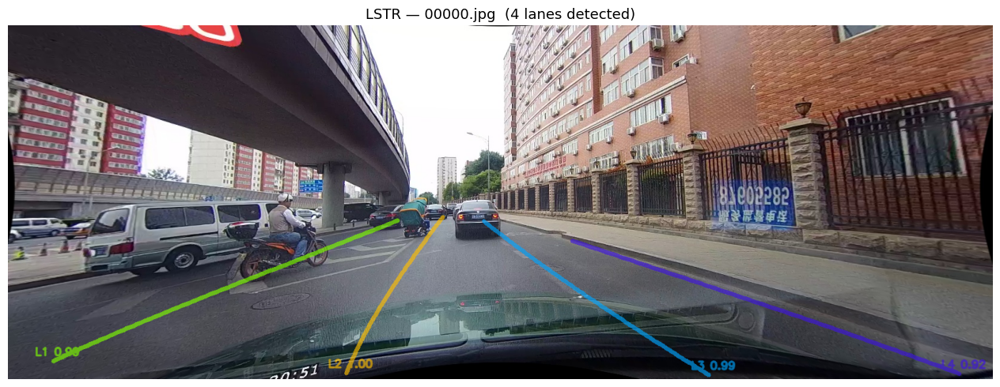

  Saved → prediction_sample.png


In [70]:
LANE_COLORS = [
    (0,   255, 127),
    (0,   191, 255),
    (255, 165,   0),
    (220,  20,  60),
]

def predict_and_show(model, img_path, cfg):
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    transform = A.Compose([
        A.Resize(cfg.IMG_H, cfg.IMG_W),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std =(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])
    tensor = transform(image=img_rgb)["image"].unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad(), autocast("cuda", enabled=cfg.USE_AMP):
        out = model(tensor)

    exist_probs  = torch.sigmoid(out["exist_logits"])[0].cpu().numpy()
    poly_coeffs  = out["poly_preds"][0].cpu().numpy()
    y_range_pred = out["y_range_preds"][0].cpu().numpy()

    print(f"{'Lane':<8} {'Detected':<12} {'Confidence':<14} {'y_start':<10} {'y_end':<10} Poly coeffs")
    print("─" * 80)
    for i in range(cfg.MAX_LANES):
        status = "✓ YES" if exist_probs[i] > cfg.THRESHOLD else "✗ no"
        print(f"  {i+1:<6} {status:<12} "
              f"{exist_probs[i]:.4f}        "
              f"{y_range_pred[i,0]:.3f}     "
              f"{y_range_pred[i,1]:.3f}     "
              f"{[round(c,4) for c in poly_coeffs[i].tolist()]}")

    detected = []
    for i in range(cfg.MAX_LANES):
        if exist_probs[i] > cfg.THRESHOLD:
            y_s = float(y_range_pred[i, 0])
            y_e = float(y_range_pred[i, 1])
            if is_valid_lane(poly_coeffs[i], cfg, y_start=y_s, y_end=y_e):
                detected.append((i, poly_coeffs[i], exist_probs[i], y_s, y_e))
            else:
                print(f"  Lane {i+1} rejected by validity check")

    detected = remove_crossing_lanes(detected)
    print(f"\n  Lanes after all filters : {len(detected)}")

    overlay = img_bgr.copy()
    for rank, (orig_idx, coeffs, prob, y_s, y_e) in enumerate(detected):
        color = LANE_COLORS[rank % len(LANE_COLORS)]
        pts   = poly_to_points(coeffs, cfg, y_start=y_s, y_end=y_e)
        if len(pts) < 2:
            continue
        for j in range(len(pts) - 1):
            cv2.line(overlay, pts[j], pts[j+1], color, thickness=6)
        bx, by = pts[-1]
        cv2.putText(overlay, f"L{rank+1} {prob:.2f}",
                    (bx - 30, by - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2, cv2.LINE_AA)

    vis     = cv2.addWeighted(overlay, 0.65, img_bgr, 0.35, 0)
    vis_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(14, 5))
    plt.imshow(vis_rgb)
    plt.axis("off")
    plt.title(f"LSTR — {os.path.basename(img_path)}  "
              f"({len(detected)} lanes detected)", fontsize=13)
    plt.tight_layout()
    plt.savefig("prediction_sample.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("  Saved → prediction_sample.png")


load_checkpoint(model, path="lstr_best.pth")
sample_img_path = test_samples[0][0]
print(f"Running on : {sample_img_path}\n")
predict_and_show(model, sample_img_path, cfg)

  ✓ Loaded  epoch=185  F1=0.7118  saved=2026-04-12 06:30:52


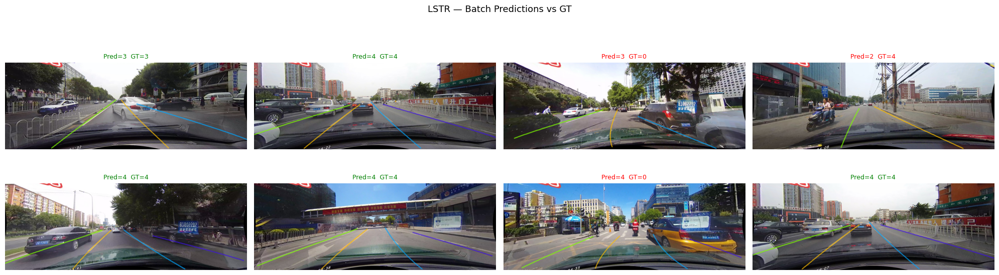

  Saved → batch_predictions.png


In [71]:
def predict_batch_visualise(model, test_samples, cfg,
                             n=8, cols=4,
                             save_path="batch_predictions.png"):
    load_checkpoint(model, path="lstr_best.pth")
    picked = random.sample(test_samples, min(n, len(test_samples)))
    rows   = math.ceil(n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 3))
    axes = axes.flatten()

    for i, (img_path, _, gt_flags) in enumerate(picked):
        img_bgr = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        transform = A.Compose([
            A.Resize(cfg.IMG_H, cfg.IMG_W),
            A.Normalize(mean=(0.485, 0.456, 0.406),
                        std =(0.229, 0.224, 0.225)),
            ToTensorV2(),
        ])
        tensor = transform(image=img_rgb)["image"].unsqueeze(0).to(device)

        with torch.no_grad(), autocast("cuda", enabled=cfg.USE_AMP):
            out = model(tensor)

        exist_probs  = torch.sigmoid(out["exist_logits"])[0].cpu().numpy()
        poly_coeffs  = out["poly_preds"][0].cpu().numpy()
        y_range_pred = out["y_range_preds"][0].cpu().numpy()

        detected = []
        for j in range(cfg.MAX_LANES):
            if exist_probs[j] > cfg.THRESHOLD:
                y_s = float(y_range_pred[j, 0])
                y_e = float(y_range_pred[j, 1])
                if is_valid_lane(poly_coeffs[j], cfg, y_start=y_s, y_end=y_e):
                    detected.append((j, poly_coeffs[j], exist_probs[j], y_s, y_e))
        detected = remove_crossing_lanes(detected)

        overlay = img_bgr.copy()
        for rank, (_, coeffs, _, y_s, y_e) in enumerate(detected):
            pts   = poly_to_points(coeffs, cfg, y_start=y_s, y_end=y_e)
            color = LANE_COLORS[rank % len(LANE_COLORS)]
            for k in range(len(pts) - 1):
                cv2.line(overlay, pts[k], pts[k+1], color, thickness=5)

        vis  = cv2.addWeighted(overlay, 0.7, img_bgr, 0.3, 0)
        vis  = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
        n_gt = sum(gt_flags)
        axes[i].imshow(vis)
        axes[i].axis("off")
        axes[i].set_title(
            f"Pred={len(detected)}  GT={n_gt}",
            fontsize=9,
            color="green" if len(detected) == n_gt else "red"
        )

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("LSTR — Batch Predictions vs GT", fontsize=13, y=1.01)
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"  Saved → {save_path}")


predict_batch_visualise(model, test_samples, cfg, n=8, cols=4)

In [72]:
def export_predictions(model, test_samples, cfg,
                       out_path="test_predictions.json"):
    load_checkpoint(model, path="lstr_best.pth")
    model.eval()
    all_results = []

    for img_path, _, _ in tqdm(test_samples, desc="Exporting", ncols=80):
        img_bgr = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        transform = A.Compose([
            A.Resize(cfg.IMG_H, cfg.IMG_W),
            A.Normalize(mean=(0.485, 0.456, 0.406),
                        std =(0.229, 0.224, 0.225)),
            ToTensorV2(),
        ])
        tensor = transform(image=img_rgb)["image"].unsqueeze(0).to(device)

        with torch.no_grad(), autocast("cuda", enabled=cfg.USE_AMP):
            out = model(tensor)

        exist_probs  = torch.sigmoid(out["exist_logits"])[0].cpu().numpy()
        poly_coeffs  = out["poly_preds"][0].cpu().numpy()
        y_range_pred = out["y_range_preds"][0].cpu().numpy()   # fixed

        detected = []
        for i in range(cfg.MAX_LANES):
            if exist_probs[i] > cfg.THRESHOLD:
                y_s = float(y_range_pred[i, 0])
                y_e = float(y_range_pred[i, 1])
                if is_valid_lane(poly_coeffs[i], cfg, y_start=y_s, y_end=y_e):
                    detected.append((i, poly_coeffs[i], exist_probs[i], y_s, y_e))
        detected = remove_crossing_lanes(detected)

        lanes = []
        for rank, (orig_idx, coeffs, prob, y_s, y_e) in enumerate(detected):
            lanes.append({
                "lane_id":    rank + 1,
                "exists":     True,
                "confidence": float(prob),
                "poly":       coeffs.tolist(),
                "y_start":    y_s,
                "y_end":      y_e,
            })

        all_results.append({"image": img_path, "lanes": lanes})

    with open(out_path, "w") as f:
        json.dump(all_results, f, indent=2)

    print(f"  Saved {len(all_results):,} predictions → {out_path}")
    return all_results


preds_json = export_predictions(model, test_samples, cfg)
print(json.dumps(preds_json[0], indent=2))

  ✓ Loaded  epoch=185  F1=0.7118  saved=2026-04-12 06:30:52


Exporting: 100%|████████████████████████████| 6004/6004 [05:10<00:00, 19.36it/s]


  Saved 6,004 predictions → test_predictions.json
{
  "image": "/kaggle/input/datasets/manideep1108/culane/CULane/driver_100_30frame/driver_100_30frame/05251330_0404.MP4/00000.jpg",
  "lanes": [
    {
      "lane_id": 1,
      "exists": true,
      "confidence": 0.99267578125,
      "poly": [
        0.63916015625,
        -1.2802734375,
        -0.0635986328125,
        0.71337890625
      ],
      "y_start": 0.5517578125,
      "y_end": 0.94970703125
    },
    {
      "lane_id": 2,
      "exists": true,
      "confidence": 0.9951171875,
      "poly": [
        0.1314697265625,
        -0.15234375,
        -0.2255859375,
        0.587890625
      ],
      "y_start": 0.54150390625,
      "y_end": 0.984375
    },
    {
      "lane_id": 3,
      "exists": true,
      "confidence": 0.99267578125,
      "poly": [
        -0.11712646484375,
        0.41455078125,
        0.1009521484375,
        0.320068359375
      ],
      "y_start": 0.5537109375,
      "y_end": 0.98828125
    },
    {
 

  ✓ Loaded  epoch=185  F1=0.7118  saved=2026-04-12 06:30:52


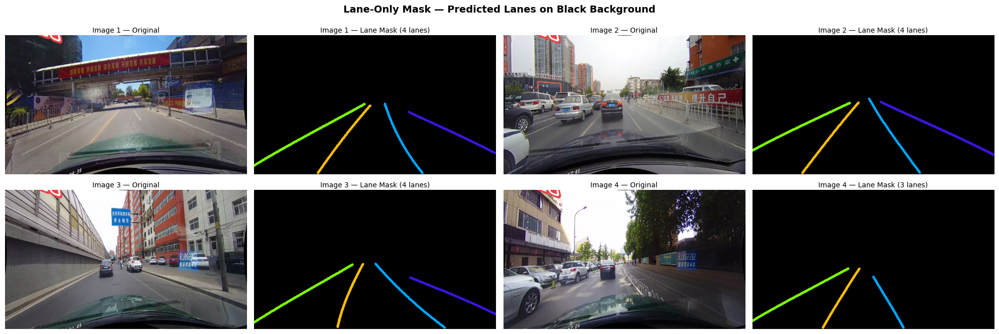

Saved → /kaggle/working/lane_masks.png


In [73]:
# ── Visualisation 1: Lane-Only Mask — 4 images ───────────────────────────────
# Each image: LEFT = original  |  RIGHT = black canvas with predicted lanes only

def visualise_lane_masks(model, test_samples, cfg, n=4,
                         save_path="/kaggle/working/lane_masks.png",
                         threshold=None):
    if threshold is None:
        threshold = cfg.THRESHOLD

    load_checkpoint(model, path="lstr_best.pth")
    model.eval()

    transform = A.Compose([
        A.Resize(cfg.IMG_H, cfg.IMG_W),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])

    COLORS_BGR = [
        (127, 255,   0),
        (255, 191,   0),
        (  0, 165, 255),
        ( 60,  20, 220),
    ]

    picked = random.sample(test_samples, min(n, len(test_samples)))

    PAIRS_PER_ROW = 2
    rows = math.ceil(n / PAIRS_PER_ROW)
    fig, axes = plt.subplots(rows, PAIRS_PER_ROW * 2,
                              figsize=(PAIRS_PER_ROW * 2 * 5, rows * 3.5))
    axes = np.array(axes).reshape(rows, PAIRS_PER_ROW * 2)

    for i, (img_path, _, _) in enumerate(picked):
        row_idx  = i // PAIRS_PER_ROW
        col_base = (i %  PAIRS_PER_ROW) * 2

        img_bgr = cv2.imread(img_path)
        if img_bgr is None:
            axes[row_idx, col_base].axis("off")
            axes[row_idx, col_base + 1].axis("off")
            continue

        img_rgb  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_disp = cv2.resize(img_rgb, (cfg.IMG_W, cfg.IMG_H))

        tensor = transform(image=img_rgb)["image"].unsqueeze(0).to(device)
        with torch.no_grad(), autocast("cuda", enabled=cfg.USE_AMP):
            out = model(tensor)

        exist_probs  = torch.sigmoid(out["exist_logits"])[0].cpu().numpy()
        poly_coeffs  = out["poly_preds"][0].cpu().numpy()
        y_range_pred = out["y_range_preds"][0].cpu().numpy()

        mask_canvas = np.zeros((cfg.IMG_H, cfg.IMG_W, 3), dtype=np.uint8)
        n_drawn = 0

        for li in range(cfg.MAX_LANES):
            if exist_probs[li] <= threshold:
                continue
            y_s = float(y_range_pred[li, 0])
            y_e = float(y_range_pred[li, 1])
            if not is_valid_lane(poly_coeffs[li], cfg, y_start=y_s, y_end=y_e):
                continue
            ys = np.linspace(max(y_s, cfg.POLY_Y_MIN),
                             min(y_e, cfg.POLY_Y_MAX), 200)
            xs = np.polyval(poly_coeffs[li], ys)
            ok = (xs >= 0) & (xs <= 1)
            if ok.sum() < 2:
                continue
            pts = list(zip((xs[ok] * cfg.IMG_W).astype(int),
                           (ys[ok] * cfg.IMG_H).astype(int)))
            color = COLORS_BGR[li % len(COLORS_BGR)]
            for j in range(len(pts) - 1):
                cv2.line(mask_canvas, pts[j], pts[j+1], color, thickness=6)
            n_drawn += 1

        axes[row_idx, col_base].imshow(img_disp)
        axes[row_idx, col_base].axis("off")
        axes[row_idx, col_base].set_title(f"Image {i+1} — Original", fontsize=10, pad=4)

        axes[row_idx, col_base + 1].imshow(mask_canvas)
        axes[row_idx, col_base + 1].axis("off")
        axes[row_idx, col_base + 1].set_title(
            f"Image {i+1} — Lane Mask ({n_drawn} lanes)", fontsize=10, pad=4)

    plt.suptitle("Lane-Only Mask — Predicted Lanes on Black Background",
                 fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved → {save_path}")


visualise_lane_masks(model, test_samples, cfg, n=4)

  ✓ Loaded  epoch=185  F1=0.7118  saved=2026-04-12 06:30:52


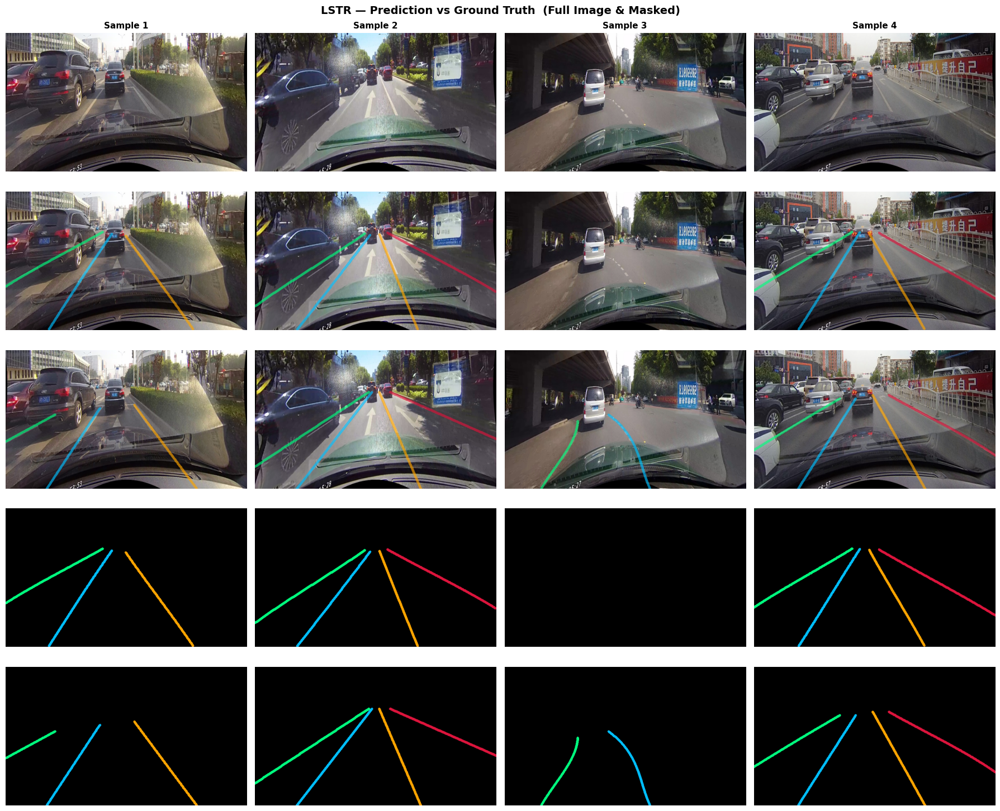

Saved → /kaggle/working/pred_vs_gt_grid.png


In [74]:
# ── Visualisation 2: Prediction vs Ground Truth — Grid Row Layout ─────────────
# 4 images across columns. 5 rows:
#   Row 0 : Original image
#   Row 1 : Prediction overlaid on full image
#   Row 2 : Ground truth overlaid on full image
#   Row 3 : Prediction on black background
#   Row 4 : Ground truth on black background

def _draw_poly_lanes(canvas_bgr, coeffs_list, exist_flags, cfg,
                     y_ranges=None, thickness=6,
                     blend_with=None, blend_alpha=0.65):
    COLORS_BGR = [
        (127, 255,   0),
        (255, 191,   0),
        (  0, 165, 255),
        ( 60,  20, 220),
    ]
    out = canvas_bgr.copy()
    for li, (coeffs, ex) in enumerate(zip(coeffs_list, exist_flags)):
        if not ex:
            continue
        y_s = float(y_ranges[li][0]) if y_ranges else cfg.POLY_Y_MIN
        y_e = float(y_ranges[li][1]) if y_ranges else cfg.POLY_Y_MAX
        y_s = max(y_s, cfg.POLY_Y_MIN)
        y_e = min(y_e, cfg.POLY_Y_MAX)
        ys  = np.linspace(y_s, y_e, 200)
        xs  = np.polyval(coeffs, ys)
        ok  = (xs >= 0) & (xs <= 1)
        if ok.sum() < 2:
            continue
        pts = list(zip((xs[ok] * cfg.IMG_W).astype(int),
                       (ys[ok] * cfg.IMG_H).astype(int)))
        color = COLORS_BGR[li % len(COLORS_BGR)]
        for j in range(len(pts) - 1):
            cv2.line(out, pts[j], pts[j+1], color, thickness=thickness)
    if blend_with is not None:
        out = cv2.addWeighted(out, blend_alpha, blend_with, 1 - blend_alpha, 0)
    return cv2.cvtColor(out, cv2.COLOR_BGR2RGB)


def _parse_gt_lanes(anno_path, cfg):
    cropped_H = cfg.ORIG_H - cfg.CROP_TOP
    raw = []
    if os.path.exists(anno_path):
        with open(anno_path) as af:
            for line in af:
                pts = list(map(float, line.strip().split()))
                if len(pts) < 4:
                    continue
                xs = np.array(pts[0::2])
                ys = np.array(pts[1::2])
                ys_sh = ys - cfg.CROP_TOP
                valid = (ys_sh >= 0) & (ys_sh <= cropped_H)
                if valid.sum() < 2:
                    continue
                xn = xs[valid] / cfg.ORIG_W
                yn = ys_sh[valid] / cropped_H
                order = np.argsort(yn)
                raw.append((xn[order], yn[order]))

    coeffs_list, exists, y_ranges = [], [], []
    for li in range(cfg.MAX_LANES):
        if li < len(raw):
            xg, yg = raw[li]
            try:
                c = np.polyfit(yg, xg, cfg.POLY_DEGREE).astype(np.float32)
            except Exception:
                c = np.zeros(cfg.POLY_DEGREE + 1, np.float32)
            coeffs_list.append(c)
            y_ranges.append((float(yg.min()), float(yg.max())))
            exists.append(True)
        else:
            coeffs_list.append(np.zeros(cfg.POLY_DEGREE + 1, np.float32))
            y_ranges.append((cfg.POLY_Y_MIN, cfg.POLY_Y_MAX))
            exists.append(False)
    return coeffs_list, exists, y_ranges


def visualise_pred_vs_gt_grid(model, test_samples, cfg, n=4,
                               save_path="/kaggle/working/pred_vs_gt_grid.png",
                               threshold=None):
    if threshold is None:
        threshold = cfg.THRESHOLD

    load_checkpoint(model, path="lstr_best.pth")
    model.eval()

    transform = A.Compose([
        A.Resize(cfg.IMG_H, cfg.IMG_W),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])

    picked = random.sample(test_samples, min(n, len(test_samples)))

    ROW_LABELS = [
        "Original",
        "Pred — Full Image",
        "GT   — Full Image",
        "Pred — Masked",
        "GT   — Masked",
    ]
    N_ROWS = len(ROW_LABELS)

    fig, axes = plt.subplots(N_ROWS, n, figsize=(n * 4.5, N_ROWS * 3.0))
    if n == 1:
        axes = axes[:, np.newaxis]

    for ci in range(n):
        axes[0, ci].set_title(f"Sample {ci+1}", fontsize=11,
                               fontweight="bold", pad=6)
    for ri, lbl in enumerate(ROW_LABELS):
        axes[ri, 0].set_ylabel(lbl, fontsize=10, fontweight="bold",
                                rotation=0, labelpad=90, va="center")

    for ci, (img_path, anno_path, _) in enumerate(picked):
        img_bgr = cv2.imread(img_path)
        if img_bgr is None:
            for ri in range(N_ROWS):
                axes[ri, ci].axis("off")
            continue

        img_bgr_crop = img_bgr[cfg.CROP_TOP:, :]
        img_bgr_disp = cv2.resize(img_bgr_crop, (cfg.IMG_W, cfg.IMG_H))
        img_rgb_disp = cv2.cvtColor(img_bgr_disp, cv2.COLOR_BGR2RGB)

        tensor = transform(image=img_rgb_disp)["image"].unsqueeze(0).to(device)
        with torch.no_grad(), autocast("cuda", enabled=cfg.USE_AMP):
            out = model(tensor)

        exist_probs  = torch.sigmoid(out["exist_logits"])[0].cpu().numpy()
        poly_coeffs  = out["poly_preds"][0].cpu().numpy()
        y_range_pred = out["y_range_preds"][0].cpu().numpy()

        pred_exists = [bool(exist_probs[li] > threshold) for li in range(cfg.MAX_LANES)]
        pred_ranges = [(y_range_pred[li, 0], y_range_pred[li, 1])
                       for li in range(cfg.MAX_LANES)]

        gt_coeffs, gt_exists, gt_ranges = _parse_gt_lanes(anno_path, cfg)

        black = np.zeros_like(img_bgr_disp)

        panels = [
            img_rgb_disp,
            _draw_poly_lanes(img_bgr_disp, poly_coeffs, pred_exists, cfg,
                             y_ranges=pred_ranges, blend_with=img_bgr_disp),
            _draw_poly_lanes(img_bgr_disp, gt_coeffs,  gt_exists,  cfg,
                             y_ranges=gt_ranges,  blend_with=img_bgr_disp),
            _draw_poly_lanes(black, poly_coeffs, pred_exists, cfg,
                             y_ranges=pred_ranges),
            _draw_poly_lanes(black, gt_coeffs,  gt_exists,  cfg,
                             y_ranges=gt_ranges),
        ]

        for ri, panel in enumerate(panels):
            axes[ri, ci].imshow(panel)
            axes[ri, ci].axis("off")

    plt.suptitle("LSTR — Prediction vs Ground Truth  (Full Image & Masked)",
                 fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved → {save_path}")


visualise_pred_vs_gt_grid(model, test_samples, cfg, n=4)

In [75]:
# ── VIDEO GENERATION FROM TEST SAMPLES ───────────────────────────────────────
# Picks frames from one continuous video folder so it looks like a driving video

def generate_lane_video(test_samples, cfg,
                        num_frames=200,
                        fps=15,
                        out_path="/kaggle/working/lane_detection.mp4"):

    # ── Pick frames from a single video folder for continuity ────────────────
    # Group test_samples by their parent folder
    from collections import defaultdict
    folder_map = defaultdict(list)
    for sample in test_samples:
        img_path = sample[0]
        folder   = os.path.dirname(img_path)
        folder_map[folder].append(sample)

    # Pick the folder with the most frames
    best_folder = max(folder_map, key=lambda f: len(folder_map[f]))
    folder_samples = sorted(folder_map[best_folder], key=lambda s: s[0])
    selected = folder_samples[:num_frames]

    print(f"✓ Selected folder : {best_folder}")
    print(f"✓ Total frames    : {len(selected)}")

    # ── Read first frame to get output size ──────────────────────────────────
    first_img = cv2.imread(selected[0][0])
    H, W      = first_img.shape[:2]

    # ── Video writer ─────────────────────────────────────────────────────────
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter(out_path, fourcc, fps, (W, H))

    print(f"✓ Output size     : {W}x{H}  |  FPS={fps}")
    print(f"  Writing video...")

    # Temporal smoothing — carry over poly coeffs from previous frame
    prev_polys = [None] * cfg.MAX_LANES
    ALPHA      = 0.6   # smoothing strength (0=no smoothing, 1=full carry-over)

    for frame_idx, (img_path, _, gt_flags) in enumerate(selected):
        img_bgr = cv2.imread(img_path)
        if img_bgr is None:
            continue

        # ── Run inference ─────────────────────────────────────────────────
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        transform = A.Compose([
            A.Resize(cfg.IMG_H, cfg.IMG_W),
            A.Normalize(mean=(0.485, 0.456, 0.406),
                        std =(0.229, 0.224, 0.225)),
            ToTensorV2(),
        ])
        tensor = transform(image=img_rgb)["image"].unsqueeze(0).to(device)

        with torch.no_grad(), autocast("cuda", enabled=cfg.USE_AMP):
            out = model(tensor)

        exist_probs  = torch.sigmoid(out["exist_logits"])[0].cpu().numpy()
        poly_coeffs  = out["poly_preds"][0].cpu().numpy()
        y_range_pred = out["y_range_preds"][0].cpu().numpy()

        # ── Temporal smoothing ────────────────────────────────────────────
        for i in range(cfg.MAX_LANES):
            if exist_probs[i] > cfg.THRESHOLD and prev_polys[i] is not None:
                poly_coeffs[i] = ALPHA * prev_polys[i] + (1 - ALPHA) * poly_coeffs[i]
            if exist_probs[i] > cfg.THRESHOLD:
                prev_polys[i] = poly_coeffs[i].copy()
            else:
                prev_polys[i] = None  # reset if lane disappears

        # ── Filter lanes ──────────────────────────────────────────────────
        detected = []
        for i in range(cfg.MAX_LANES):
            if exist_probs[i] > cfg.THRESHOLD:
                y_s = float(y_range_pred[i, 0])
                y_e = float(y_range_pred[i, 1])
                if is_valid_lane(poly_coeffs[i], cfg, y_start=y_s, y_end=y_e):
                    detected.append((i, poly_coeffs[i], exist_probs[i], y_s, y_e))
        detected = remove_crossing_lanes(detected)

        # ── Draw lanes ────────────────────────────────────────────────────
        overlay = img_bgr.copy()
        for rank, (_, coeffs, prob, y_s, y_e) in enumerate(detected):
            color = LANE_COLORS[rank % len(LANE_COLORS)]
            pts   = poly_to_points(coeffs, cfg, y_start=y_s, y_end=y_e)
            if len(pts) < 2:
                continue
            for j in range(len(pts) - 1):
                cv2.line(overlay, pts[j], pts[j+1], color, thickness=6)
            bx, by = pts[-1]
            cv2.putText(overlay, f"L{rank+1} {prob:.2f}",
                        (bx - 30, by - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2, cv2.LINE_AA)

        frame = cv2.addWeighted(overlay, 0.7, img_bgr, 0.3, 0)

        # ── HUD overlay ───────────────────────────────────────────────────
        cv2.rectangle(frame, (0, 0), (320, 36), (0, 0, 0), -1)
        cv2.putText(frame,
                    f"Frame {frame_idx+1}/{len(selected)}  |  Lanes: {len(detected)}",
                    (10, 24),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2, cv2.LINE_AA)

        writer.write(frame)

        if (frame_idx + 1) % 20 == 0:
            print(f"  [{frame_idx+1}/{len(selected)}] lanes={len(detected)}")

    writer.release()
    print(f"\n✓ Video saved → {out_path}")
    print(f"  Duration : {len(selected)/fps:.1f}s  |  Frames : {len(selected)}")
    return out_path


# ── RUN ───────────────────────────────────────────────────────────────────────
video_path = generate_lane_video(
    test_samples,
    cfg,
    num_frames = 200,   # ← increase for longer video (max = frames in folder)
    fps        = 15,
    out_path   = "/kaggle/working/lane_detection.mp4"
)

✓ Selected folder : /kaggle/input/datasets/manideep1108/culane/CULane/driver_100_30frame/driver_100_30frame/05251330_0404.MP4
✓ Total frames    : 180
✓ Output size     : 1640x590  |  FPS=15
  Writing video...
  [20/180] lanes=3
  [40/180] lanes=3
  [60/180] lanes=4
  [80/180] lanes=3
  [100/180] lanes=4
  [120/180] lanes=4
  [140/180] lanes=3
  [160/180] lanes=3
  [180/180] lanes=4

✓ Video saved → /kaggle/working/lane_detection.mp4
  Duration : 12.0s  |  Frames : 180


In [76]:
# ── B: Install YOLOv8 & camera model constants ───────────────────────────────
!pip install ultralytics -q

from ultralytics import YOLO
from collections import defaultdict

YOLO_MODEL_SIZE = "yolov8n.pt"      # nano — swap to yolov8s/m for more accuracy
yolo_model = YOLO(YOLO_MODEL_SIZE)
yolo_model.to(device)

# COCO vehicle class IDs
VEHICLE_CLASSES = {2: "car", 3: "motorcycle", 5: "bus", 7: "truck"}

# ── Pinhole camera model (CULane 1640×590, FOV ~100°) ────────────────────────
FOCAL_LEN    = 695.0      # pixels  — tune if you have calibration
REAL_HEIGHTS = {2: 1.50, 3: 1.20, 5: 3.20, 7: 3.50}   # metres per class

# ── TTC warning thresholds (seconds) ─────────────────────────────────────────
TTC_CRITICAL = 2.0        # RED    — imminent
TTC_WARNING  = 4.0        # ORANGE — caution
TTC_ADVISORY = 6.0        # YELLOW — heads-up

print(f"✓ YOLOv8 ({YOLO_MODEL_SIZE}) loaded on {device}")
print(f"  Vehicle classes : {VEHICLE_CLASSES}")
print(f"  TTC thresholds  : CRITICAL < {TTC_CRITICAL}s | WARNING < {TTC_WARNING}s | ADVISORY < {TTC_ADVISORY}s")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 25.0 MB/s eta 0:00:0000:01
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
✓ YOLOv8 (yolov8n.pt) loaded on cuda
  Vehicle classes : {2: 'car', 3: 'motorcycle', 5: 'bus', 7: 'truck'}
  TTC thresholds  : CRITICAL < 2.0s | WARNING < 4.0s | ADVISORY < 6.0s


In [77]:
# ── C: Virtual Window — ego-lane spatial mask ────────────────────────────────

def _lane_pts_px(coeffs, cfg, y_s, y_e, out_h, out_w, n=40):
    """Polynomial coeffs → pixel point list at output resolution (out_h, out_w)."""
    ys  = np.linspace(max(y_s, cfg.POLY_Y_MIN), min(y_e, cfg.POLY_Y_MAX), n)
    xs  = np.polyval(coeffs, ys)
    ok  = (xs >= 0) & (xs <= 1)
    if ok.sum() < 2:
        return []
    return list(zip(
        np.clip((xs[ok] * out_w).astype(int), 0, out_w - 1),
        np.clip((ys[ok] * out_h).astype(int), 0, out_h - 1),
    ))


def build_virtual_window(detected_lanes, cfg, img_h, img_w):
    """
    Pick the two innermost ego-lanes → filled polygon mask.
    Returns: mask (uint8 HxW, 255 inside), poly_pts, left_pts, right_pts
    """
    if len(detected_lanes) < 2:
        # Fallback: lower two-thirds of image
        mask = np.zeros((img_h, img_w), dtype=np.uint8)
        cv2.rectangle(mask, (0, img_h // 3), (img_w, img_h), 255, -1)
        return mask, None, None, None

    mid_x = img_w // 2

    def _bottom_x(lane):
        _, co, _, y_s, y_e = lane
        pts = _lane_pts_px(co, cfg, y_s, y_e, img_h, img_w)
        return pts[-1][0] if pts else 0

    def _dist_mid(lane):
        return abs(_bottom_x(lane) - mid_x)

    # Two lanes closest to image centre → ego pair
    ego = sorted(sorted(detected_lanes, key=_dist_mid)[:2], key=_bottom_x)
    left_lane, right_lane = ego[0], ego[1]

    _, lc, _, ly_s, ly_e = left_lane
    _, rc, _, ry_s, ry_e = right_lane

    left_pts  = _lane_pts_px(lc, cfg, ly_s, ly_e, img_h, img_w)
    right_pts = _lane_pts_px(rc, cfg, ry_s, ry_e, img_h, img_w)

    if len(left_pts) < 2 or len(right_pts) < 2:
        mask = np.zeros((img_h, img_w), dtype=np.uint8)
        mask[img_h // 3:, :] = 255
        return mask, None, left_pts, right_pts

    polygon = left_pts + list(reversed(right_pts))
    poly_np = np.array(polygon, dtype=np.int32).reshape(-1, 1, 2)
    mask    = np.zeros((img_h, img_w), dtype=np.uint8)
    cv2.fillPoly(mask, [poly_np], 255)
    return mask, polygon, left_pts, right_pts

print("✓ build_virtual_window() ready")


✓ build_virtual_window() ready


In [78]:
# ── D: YOLO Detection Filtered by Virtual Window ────────────────────────────

def yolo_in_window(yolo_model, img_bgr, window_mask,
                   conf_thresh=0.35, iou_thresh=0.45):
    """
    Run YOLOv8 on full image; keep only detections whose bottom-center
    OR >40% bounding-box area falls inside the virtual window mask.
    Returns list of detection dicts.
    """
    h, w = img_bgr.shape[:2]
    results = yolo_model.predict(
        source  = img_bgr,
        conf    = conf_thresh,
        iou     = iou_thresh,
        classes = list(VEHICLE_CLASSES.keys()),
        verbose = False,
        device  = device,
    )

    detections = []
    for box in results[0].boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        conf   = float(box.conf[0])
        cls_id = int(box.cls[0])
        label  = VEHICLE_CLASSES.get(cls_id, "vehicle")

        in_win = False
        if window_mask is not None:
            bc_x = np.clip((x1 + x2) // 2, 0, w - 1)
            bc_y = np.clip(min(y2, h - 1),  0, h - 1)
            in_win = bool(window_mask[bc_y, bc_x] > 0)

            # Also accept if >40% box overlaps window
            if not in_win:
                box_mask = np.zeros_like(window_mask)
                cv2.rectangle(box_mask, (x1, y1), (x2, y2), 255, -1)
                overlap   = cv2.bitwise_and(window_mask, box_mask)
                box_area  = max((x2 - x1) * (y2 - y1), 1)
                in_win    = (np.count_nonzero(overlap) / box_area) > 0.40

        detections.append({
            "bbox"      : (x1, y1, x2, y2),
            "conf"      : conf,
            "cls_id"    : cls_id,
            "label"     : label,
            "in_window" : in_win,
        })
    return detections

print("✓ yolo_in_window() ready")


✓ yolo_in_window() ready


In [79]:
# ── E: Distance Estimation + TTC Tracker ─────────────────────────────────────

def estimate_distance(bbox, cls_id):
    """Pinhole model: D = (H_real × focal_length) / h_bbox_pixels"""
    x1, y1, x2, y2 = bbox
    h_px   = max(y2 - y1, 1)
    H_real = REAL_HEIGHTS.get(cls_id, 1.5)
    return round((H_real * FOCAL_LEN) / h_px, 2)


class TTCTracker:
    """
    IoU-based multi-object tracker.
    Computes TTC = D_current / v_approach  across consecutive frames.
    """
    def __init__(self, iou_thresh=0.35, max_age=3):
        self.tracks     = {}       # track_id → {bbox, dist, ts}
        self.next_id    = 0
        self.iou_thresh = iou_thresh
        self.max_age    = max_age

    @staticmethod
    def _iou(a, b):
        ax1,ay1,ax2,ay2 = a;  bx1,by1,bx2,by2 = b
        ix1,iy1 = max(ax1,bx1), max(ay1,by1)
        ix2,iy2 = min(ax2,bx2), min(ay2,by2)
        inter   = max(0, ix2-ix1) * max(0, iy2-iy1)
        if inter == 0: return 0.0
        return inter / ((ax2-ax1)*(ay2-ay1)+(bx2-bx1)*(by2-by1)-inter)

    @staticmethod
    def _ttc_meta(ttc):
        if ttc < TTC_CRITICAL:
            return (0,0,255),   f"TTC {ttc:.1f}s !!",  "CRITICAL"
        elif ttc < TTC_WARNING:
            return (0,128,255), f"TTC {ttc:.1f}s !",   "WARNING"
        elif ttc < TTC_ADVISORY:
            return (0,220,255), f"TTC {ttc:.1f}s",     "ADVISORY"
        elif ttc == float("inf"):
            return (0,200,0),   "TTC  --",              "SAFE"
        else:
            return (0,200,0),   f"TTC {ttc:.1f}s",     "SAFE"

    def update(self, detections, timestamp):
        """
        Enrich in-window detections with track_id, distance_m, ttc_s,
        ttc_color, ttc_label, ttc_level.
        """
        # Prune stale tracks
        self.tracks = {
            tid: info for tid, info in self.tracks.items()
            if (timestamp - info["ts"]) < self.max_age
        }

        matched = set()
        out     = []

        for det in detections:
            bbox   = det["bbox"]
            cls_id = det["cls_id"]
            dist   = estimate_distance(bbox, cls_id)

            # Match to existing track
            best_tid, best_iou = None, self.iou_thresh
            for tid, info in self.tracks.items():
                if tid in matched: continue
                iou = self._iou(bbox, info["bbox"])
                if iou > best_iou:
                    best_iou, best_tid = iou, tid

            if best_tid is not None:
                prev   = self.tracks[best_tid]
                dt     = max(timestamp - prev["ts"], 1e-3)
                v_rel  = (prev["dist"] - dist) / dt   # +ve = approaching
                ttc    = (dist / v_rel) if v_rel > 0.5 else float("inf")
                tid    = best_tid
            else:
                ttc = float("inf")
                tid = self.next_id
                self.next_id += 1

            color, label, level = self._ttc_meta(ttc)
            self.tracks[tid] = {"bbox": bbox, "dist": dist, "ts": timestamp}
            matched.add(tid)

            out.append({
                **det,
                "track_id"  : tid,
                "distance_m": dist,
                "ttc_s"     : ttc,
                "ttc_color" : color,
                "ttc_label" : label,
                "ttc_level" : level,
            })
        return out

print("✓ TTCTracker ready  |  thresholds: CRITICAL<{:.0f}s  WARNING<{:.0f}s  ADVISORY<{:.0f}s".format(
    TTC_CRITICAL, TTC_WARNING, TTC_ADVISORY))


✓ TTCTracker ready  |  thresholds: CRITICAL<2s  WARNING<4s  ADVISORY<6s


In [82]:
# ── F: Dual-Stream Fusion + TTC Visualiser ───────────────────────────────────

# Colour palette
_LANE_COLORS  = [(0,255,127),(0,191,255),(255,165,0),(220,20,60)]
_WIN_COLOR    = np.array([144,238,144], dtype=np.float32)   # light green
_BOX_OUT      = (80, 80, 80)                                # grey — outside ROI

def _draw_warning_banner(canvas, level_counts, H, W):
    if level_counts["CRITICAL"] > 0:
        col  = (0, 0, 200)
        msg  = f"⚠  COLLISION WARNING  —  {level_counts['CRITICAL']} vehicle(s) CRITICAL  ⚠"
    elif level_counts["WARNING"] > 0:
        col  = (0, 100, 220)
        msg  = f"⚠  CAUTION  —  {level_counts['WARNING']} vehicle(s) in WARNING zone"
    elif level_counts["ADVISORY"] > 0:
        col  = (0, 180, 220)
        msg  = f"  ADVISORY  —  {level_counts['ADVISORY']} vehicle(s) approaching"
    else:
        return  # no banner needed

    cv2.rectangle(canvas, (0, H-44), (W, H), col, -1)
    cv2.putText(canvas, msg, (12, H-14),
                cv2.FONT_HERSHEY_SIMPLEX, 0.72, (255,255,255), 2, cv2.LINE_AA)


def fuse_and_visualize_ttc(lstr_model, yolo_model, img_path, cfg,
                            tracker=None, timestamp=None,
                            save_path=None, show=True):
    if timestamp is None:
        timestamp = time.time()

    # ── Load image ────────────────────────────────────────────────────────────
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        print(f"  [WARN] Cannot read {img_path}")
        return None
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    H, W    = img_bgr.shape[:2]

    # ── 1. LSTR inference ─────────────────────────────────────────────────────
    transform = A.Compose([
        A.Resize(cfg.IMG_H, cfg.IMG_W),
        A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
        ToTensorV2(),
    ])
    tensor = transform(image=img_rgb)["image"].unsqueeze(0).to(device)
    lstr_model.eval()
    with torch.no_grad(), autocast("cuda", enabled=cfg.USE_AMP):
        out = lstr_model(tensor)

    exist_probs  = torch.sigmoid(out["exist_logits"])[0].cpu().numpy()
    poly_coeffs  = out["poly_preds"][0].cpu().numpy()
    y_range_pred = out["y_range_preds"][0].cpu().numpy()

    detected_lanes = []
    for i in range(cfg.MAX_LANES):
        if exist_probs[i] > cfg.THRESHOLD:
            y_s, y_e = float(y_range_pred[i,0]), float(y_range_pred[i,1])
            if is_valid_lane(poly_coeffs[i], cfg, y_start=y_s, y_end=y_e):
                detected_lanes.append((i, poly_coeffs[i], exist_probs[i], y_s, y_e))
    detected_lanes = remove_crossing_lanes(detected_lanes)

    # ── 2. Virtual window ─────────────────────────────────────────────────────
    win_mask, _, left_pts, right_pts = build_virtual_window(detected_lanes, cfg, H, W)

    # ── 3. YOLO + ROI filter ──────────────────────────────────────────────────
    all_dets    = yolo_in_window(yolo_model, img_bgr, win_mask)
    in_win_dets = [d for d in all_dets if d["in_window"]]
    out_dets    = [d for d in all_dets if not d["in_window"]]

    # ── 4. TTC tracking ───────────────────────────────────────────────────────
    if tracker is not None:
        in_win_dets = tracker.update(in_win_dets, timestamp)
    else:
        for d in in_win_dets:
            d.update({"track_id":-1, "distance_m": estimate_distance(d["bbox"],d["cls_id"]),
                      "ttc_s":float("inf"), "ttc_color":(0,200,0),
                      "ttc_label":"TTC --", "ttc_level":"SAFE"})

    level_counts = {"CRITICAL":0,"WARNING":0,"ADVISORY":0,"SAFE":0}
    for d in in_win_dets:
        level_counts[d.get("ttc_level","SAFE")] += 1

    # ── 5. Draw ───────────────────────────────────────────────────────────────
    canvas = img_bgr.copy()

    # (a) Virtual window fill — semi-transparent green
    if win_mask is not None:
        overlay                  = canvas.copy()
        mask_3ch                 = win_mask[:,:,None].astype(np.float32) / 255.0
        overlay                  = (overlay * (1 - 0.25 * mask_3ch) +
                                    _WIN_COLOR[::-1] * 0.25 * mask_3ch).astype(np.uint8)
        canvas                   = overlay

    # (b) Lane boundary lines
    for rank, (_, coeffs, prob, y_s, y_e) in enumerate(detected_lanes):
        color = _LANE_COLORS[rank % len(_LANE_COLORS)]
        pts   = _lane_pts_px(coeffs, cfg, y_s, y_e, H, W, n=80)
        for j in range(len(pts)-1):
            cv2.line(canvas, pts[j], pts[j+1], color, 4)
        if pts:
            cv2.putText(canvas, f"L{rank+1}", (pts[-1][0]-15, pts[-1][1]-8),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2, cv2.LINE_AA)

    # (c) Out-of-ROI vehicles — thin grey box only
    for det in out_dets:
        x1,y1,x2,y2 = det["bbox"]
        cv2.rectangle(canvas, (x1,y1), (x2,y2), _BOX_OUT, 1)

    # (d) In-ROI vehicles — colour-coded badge + distance bar
    for det in in_win_dets:
        x1,y1,x2,y2 = det["bbox"]
        tc      = det["ttc_color"]
        dist_m  = det.get("distance_m", 0)
        ttc_lbl = det.get("ttc_label",  "TTC --")
        tid     = det.get("track_id",   -1)
        level   = det.get("ttc_level",  "SAFE")

        # Bounding box — thickness varies with urgency
        thickness = 3 if level == "CRITICAL" else 2
        cv2.rectangle(canvas, (x1,y1), (x2,y2), tc, thickness)

        # Badge (3 lines above box)
        lines   = [f"#{tid} {det['label']} {det['conf']:.2f}",
                   f"Dist {dist_m:.1f} m",
                   ttc_lbl]
        lh, bw  = 18, 148
        bh      = lh * len(lines) + 8
        bx1,by1 = x1, max(y1 - bh, 0)
        bx2,by2 = x1 + bw, y1
        cv2.rectangle(canvas, (bx1,by1), (bx2,by2), tc, -1)
        cv2.rectangle(canvas, (bx1,by1), (bx2,by2), (255,255,255), 1)
        for li, ln in enumerate(lines):
            cy = by1 + 6 + (li+1)*lh - 4
            cv2.putText(canvas, ln, (bx1+3, cy),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.44, (255,255,255), 1, cv2.LINE_AA)

        # Vertical distance bar (right of box)
        bar_h  = y2 - y1
        fill_h = int(bar_h * min(dist_m / 50.0, 1.0))
        bx     = x2 + 4
        cv2.rectangle(canvas, (bx,y1), (bx+8,y2),        (40,40,40), -1)
        cv2.rectangle(canvas, (bx,y2-fill_h),(bx+8,y2),  tc,         -1)

    # (e) HUD — top-left stats panel
    hud = [
        (f"Lanes         : {len(detected_lanes)}",   (255,255,255)),
        (f"Ego vehicles  : {len(in_win_dets)}",      (100,255,100)),
        (f"ADVISORY(<{TTC_ADVISORY:.0f}s): {level_counts['ADVISORY']}", (0,220,255)),
        (f"WARNING (<{TTC_WARNING:.0f}s): {level_counts['WARNING']}",   (0,128,255)),
        (f"CRITICAL(<{TTC_CRITICAL:.0f}s): {level_counts['CRITICAL']}", (60,60,255)),
    ]
    for k,(txt,col) in enumerate(hud):
        cv2.putText(canvas, txt, (10, 28+k*24),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.60, (0,0,0), 3, cv2.LINE_AA)
        cv2.putText(canvas, txt, (10, 28+k*24),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.60, col,   1, cv2.LINE_AA)

    # (f) Warning banner at bottom
    _draw_warning_banner(canvas, level_counts, H, W)

    if show:
        vis_rgb = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(17, 6))
        plt.imshow(vis_rgb)
        plt.axis("off")
        plt.title(f"Dual-Stream Fusion + TTC  |  {os.path.basename(img_path)}", fontsize=13)
        plt.tight_layout()
        plt.show()

    if save_path:
        cv2.imwrite(save_path, canvas)
        print(f"  Saved → {save_path}")

    return {
        "lanes"        : detected_lanes,
        "win_mask"     : win_mask,
        "vehicles_in"  : in_win_dets,
        "vehicles_out" : out_dets,
        "level_counts" : level_counts,
    }

print("✓ fuse_and_visualize_ttc() ready")


✓ fuse_and_visualize_ttc() ready


  ✓ Loaded  epoch=185  F1=0.7118  saved=2026-04-12 06:30:52
Running fusion on: /kaggle/input/datasets/manideep1108/culane/CULane/driver_100_30frame/driver_100_30frame/05251330_0404.MP4/00000.jpg



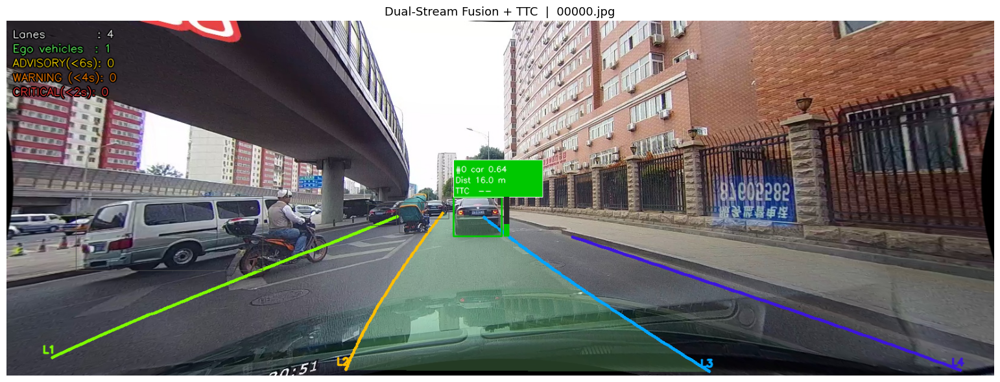

  Saved → /kaggle/working/fusion_ttc_single.png

── Summary ──────────────────────────────────
  Lanes detected   : 4
  Ego vehicles     : 1
  Out-of-ROI       : 5 (ignored)
  ADVISORY         : 0
  CRITICAL         : 0
  → #0 car          dist=16.0m  TTC=--  [SAFE]


In [83]:
# ── G: Single Image — Fusion + TTC Demo ──────────────────────────────────────
load_checkpoint(model, path="lstr_best.pth")

sample_path = test_samples[0][0]
print(f"Running fusion on: {sample_path}\n")

ttc_tracker = TTCTracker(iou_thresh=0.35, max_age=3)

result = fuse_and_visualize_ttc(
    lstr_model = model,
    yolo_model = yolo_model,
    img_path   = sample_path,
    cfg        = cfg,
    tracker    = ttc_tracker,
    timestamp  = 0.0,
    save_path  = "/kaggle/working/fusion_ttc_single.png",
    show       = True,
)

print(f"\n── Summary ──────────────────────────────────")
print(f"  Lanes detected   : {len(result['lanes'])}")
print(f"  Ego vehicles     : {len(result['vehicles_in'])}")
print(f"  Out-of-ROI       : {len(result['vehicles_out'])} (ignored)")
lc = result['level_counts']
print(f"  ADVISORY         : {lc['ADVISORY']}")
print(f"  WARNING          : {lc['WARNING']}")
print(f"  CRITICAL         : {lc['CRITICAL']}")
for d in result['vehicles_in']:
    x1,y1,x2,y2 = d['bbox']
    ttc = d['ttc_s']
    ttc_str = f"{ttc:.1f}s" if ttc != float('inf') else "--"
    print(f"  → #{d['track_id']} {d['label']:<12} dist={d['distance_m']:.1f}m  "
          f"TTC={ttc_str}  [{d['ttc_level']}]")


  ✓ Loaded  epoch=185  F1=0.7118  saved=2026-04-12 06:30:52


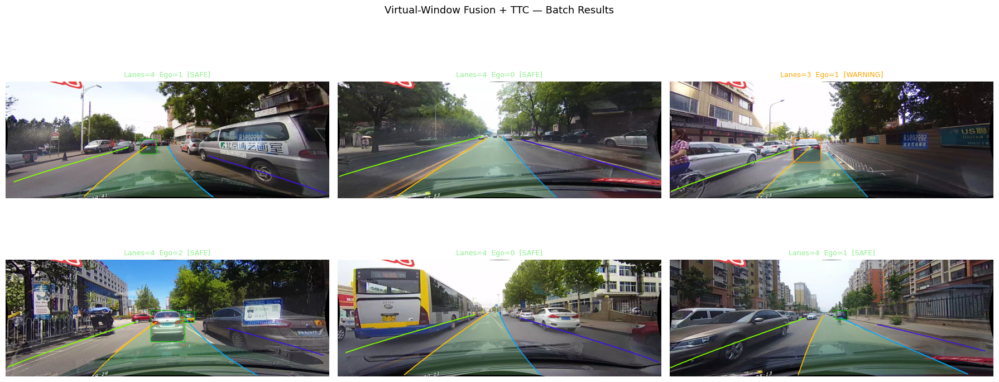

  Saved → /kaggle/working/fusion_batch.png


In [84]:
# ── H: Batch Fusion Grid — 6 test images ────────────────────────────────────

def batch_fusion_grid(lstr_model, yolo_model, test_samples, cfg,
                      n=6, cols=3,
                      save_path="/kaggle/working/fusion_batch.png"):
    load_checkpoint(lstr_model, path="lstr_best.pth")
    picked = random.sample(test_samples, min(n, len(test_samples)))
    rows   = math.ceil(len(picked) / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols*6, rows*4))
    axes = np.array(axes).flatten()

    # One fresh tracker per batch run (no cross-image TTC)
    tracker = TTCTracker()

    for i, (img_path, _, _) in enumerate(picked):
        result = fuse_and_visualize_ttc(
            lstr_model = lstr_model,
            yolo_model = yolo_model,
            img_path   = img_path,
            cfg        = cfg,
            tracker    = tracker,
            timestamp  = float(i),
            show       = False,
        )
        if result is None:
            axes[i].axis("off"); continue

        # Re-read canvas that fuse_and_visualize_ttc drew internally
        # (we pass show=False so we reconstruct a quick display frame)
        img_bgr = cv2.imread(img_path)
        H, W    = img_bgr.shape[:2]
        canvas  = img_bgr.copy()

        # Window fill
        if result["win_mask"] is not None:
            mask_3ch = result["win_mask"][:,:,None].astype(np.float32)/255.
            canvas   = (canvas*(1-0.25*mask_3ch) + _WIN_COLOR[::-1]*0.25*mask_3ch).astype(np.uint8)

        # Lanes
        for rank,(_, co, _, y_s, y_e) in enumerate(result["lanes"]):
            pts = _lane_pts_px(co, cfg, y_s, y_e, H, W)
            for j in range(len(pts)-1):
                cv2.line(canvas, pts[j], pts[j+1], _LANE_COLORS[rank%4], 3)

        # In-ROI vehicles
        for det in result["vehicles_in"]:
            x1,y1,x2,y2 = det["bbox"]
            tc  = det.get("ttc_color", (0,200,0))
            lbl = f"{det['label']} {det.get('distance_m',0):.0f}m"
            cv2.rectangle(canvas,(x1,y1),(x2,y2),tc,2)
            cv2.putText(canvas,lbl,(x1,max(y1-6,0)),
                        cv2.FONT_HERSHEY_SIMPLEX,0.45,(255,255,255),1,cv2.LINE_AA)

        lc = result["level_counts"]
        worst = ("CRITICAL" if lc["CRITICAL"] else
                 "WARNING"  if lc["WARNING"]  else
                 "ADVISORY" if lc["ADVISORY"] else "SAFE")
        title_col = {"CRITICAL":"red","WARNING":"orange",
                     "ADVISORY":"yellow","SAFE":"lightgreen"}[worst]

        axes[i].imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
        axes[i].axis("off")
        axes[i].set_title(
            f"Lanes={len(result['lanes'])}  Ego={len(result['vehicles_in'])}  [{worst}]",
            fontsize=9, color=title_col
        )

    for j in range(i+1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Virtual-Window Fusion + TTC — Batch Results", fontsize=13)
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"  Saved → {save_path}")


batch_fusion_grid(model, yolo_model, test_samples, cfg, n=6, cols=3)


Video folder : /kaggle/input/datasets/manideep1108/culane/CULane/driver_100_30frame/driver_100_30frame/05251330_0404.MP4
Frames       : 30

  ✓ Loaded  epoch=185  F1=0.7118  saved=2026-04-12 06:30:52


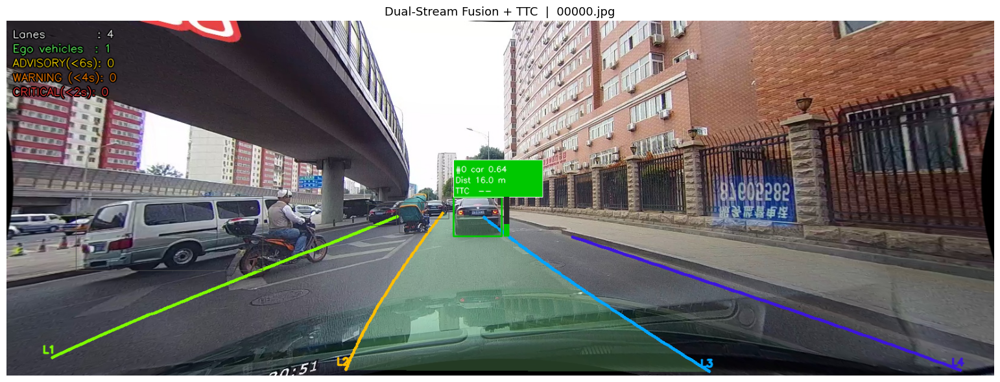

  Saved → /kaggle/working/seq_000.png
  Frame 000 | t=0.00s | lanes=4 | ego=1 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_001.png
  Frame 001 | t=0.03s | lanes=3 | ego=1 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_002.png
  Frame 002 | t=0.07s | lanes=3 | ego=2 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_003.png
  Frame 003 | t=0.10s | lanes=4 | ego=0 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_004.png
  Frame 004 | t=0.13s | lanes=4 | ego=2 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_005.png
  Frame 005 | t=0.17s | lanes=4 | ego=1 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_006.png
  Frame 006 | t=0.20s | lanes=4 | ego=1 | CRITICAL=1 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_007.png
  Frame 007 | t=0.23s | lanes=4 | ego=1 | CRITICAL=1 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_008.png
  Frame 008 | t=0.27s | lanes=4 | ego=1 | CRITICAL=0 WARNING=0 ADV

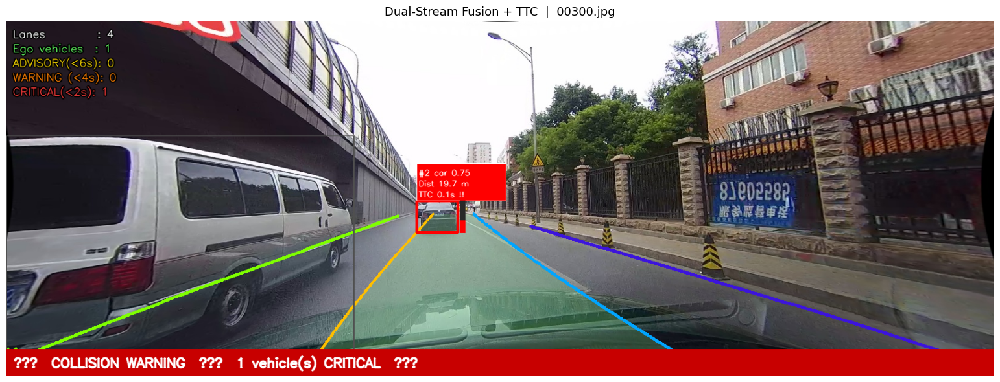

  Saved → /kaggle/working/seq_010.png
  Frame 010 | t=0.33s | lanes=4 | ego=1 | CRITICAL=1 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_011.png
  Frame 011 | t=0.37s | lanes=4 | ego=1 | CRITICAL=1 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_012.png
  Frame 012 | t=0.40s | lanes=4 | ego=2 | CRITICAL=1 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_013.png
  Frame 013 | t=0.43s | lanes=4 | ego=1 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_014.png
  Frame 014 | t=0.47s | lanes=3 | ego=2 | CRITICAL=0 WARNING=1 ADVISORY=0
  Saved → /kaggle/working/seq_015.png
  Frame 015 | t=0.50s | lanes=3 | ego=1 | CRITICAL=1 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_016.png
  Frame 016 | t=0.53s | lanes=3 | ego=1 | CRITICAL=1 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_017.png
  Frame 017 | t=0.57s | lanes=3 | ego=1 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_018.png
  Frame 018 | t=0.60s | lanes=3 | ego=1 | CRITICAL=0 WARNING=0 ADV

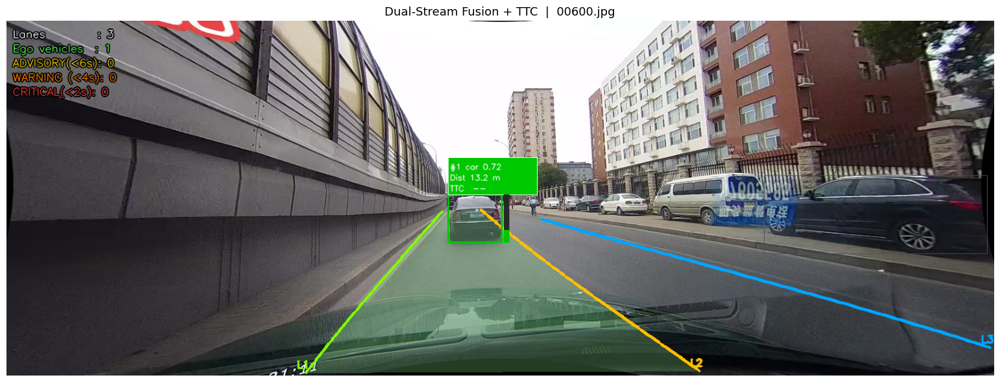

  Saved → /kaggle/working/seq_020.png
  Frame 020 | t=0.67s | lanes=3 | ego=1 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_021.png
  Frame 021 | t=0.70s | lanes=3 | ego=1 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_022.png
  Frame 022 | t=0.73s | lanes=3 | ego=1 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_023.png
  Frame 023 | t=0.77s | lanes=3 | ego=1 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_024.png
  Frame 024 | t=0.80s | lanes=3 | ego=1 | CRITICAL=0 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_025.png
  Frame 025 | t=0.83s | lanes=3 | ego=1 | CRITICAL=1 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_026.png
  Frame 026 | t=0.87s | lanes=3 | ego=1 | CRITICAL=1 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_027.png
  Frame 027 | t=0.90s | lanes=3 | ego=1 | CRITICAL=1 WARNING=0 ADVISORY=0
  Saved → /kaggle/working/seq_028.png
  Frame 028 | t=0.93s | lanes=3 | ego=1 | CRITICAL=1 WARNING=0 ADV

In [85]:
# ── I: Sequence Inference — TTC across consecutive frames ────────────────────
import glob

FPS = 30.0

# Pick consecutive frames from ONE video folder
video_folder = os.path.join(
    "/kaggle/input/datasets/manideep1108/culane/CULane",
    test_videos[0],
)
frame_paths = sorted(glob.glob(os.path.join(video_folder, "*.jpg")))[:30]

print(f"Video folder : {video_folder}")
print(f"Frames       : {len(frame_paths)}")
print()

load_checkpoint(model, path="lstr_best.pth")
seq_tracker = TTCTracker(iou_thresh=0.35, max_age=4)

for fidx, fpath in enumerate(frame_paths):
    ts     = fidx / FPS
    result = fuse_and_visualize_ttc(
        lstr_model = model,
        yolo_model = yolo_model,
        img_path   = fpath,
        cfg        = cfg,
        tracker    = seq_tracker,
        timestamp  = ts,
        save_path  = f"/kaggle/working/seq_{fidx:03d}.png",
        show       = (fidx % 10 == 0),   # display every 10th frame
    )
    if result is None: continue
    lc = result["level_counts"]
    print(f"  Frame {fidx:03d} | t={ts:.2f}s | "
          f"lanes={len(result['lanes'])} | "
          f"ego={len(result['vehicles_in'])} | "
          f"CRITICAL={lc['CRITICAL']} WARNING={lc['WARNING']} ADVISORY={lc['ADVISORY']}")


In [86]:
# ── J: Latency Benchmark ─────────────────────────────────────────────────────

def benchmark_fusion(lstr_model, yolo_model, img_path, cfg, n_runs=20):
    load_checkpoint(lstr_model, path="lstr_best.pth")
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    H, W    = img_bgr.shape[:2]

    transform = A.Compose([
        A.Resize(cfg.IMG_H, cfg.IMG_W),
        A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
        ToTensorV2(),
    ])
    tensor = transform(image=img_rgb)["image"].unsqueeze(0).to(device)

    t_lstr, t_win, t_yolo = [], [], []

    for _ in range(n_runs):
        # LSTR
        t0 = time.perf_counter()
        lstr_model.eval()
        with torch.no_grad(), autocast("cuda", enabled=cfg.USE_AMP):
            out = lstr_model(tensor)
        if device.type == "cuda": torch.cuda.synchronize()
        t_lstr.append(time.perf_counter() - t0)

        # Virtual window
        exist_probs  = torch.sigmoid(out["exist_logits"])[0].cpu().numpy()
        poly_coeffs  = out["poly_preds"][0].cpu().numpy()
        y_range_pred = out["y_range_preds"][0].cpu().numpy()
        lanes = []
        for i in range(cfg.MAX_LANES):
            if exist_probs[i] > cfg.THRESHOLD:
                y_s,y_e = float(y_range_pred[i,0]), float(y_range_pred[i,1])
                if is_valid_lane(poly_coeffs[i], cfg, y_start=y_s, y_end=y_e):
                    lanes.append((i, poly_coeffs[i], exist_probs[i], y_s, y_e))
        lanes = remove_crossing_lanes(lanes)

        t0 = time.perf_counter()
        win_mask, _, _, _ = build_virtual_window(lanes, cfg, H, W)
        t_win.append(time.perf_counter() - t0)

        # YOLO (ROI-filtered)
        t0 = time.perf_counter()
        yolo_in_window(yolo_model, img_bgr, win_mask)
        if device.type == "cuda": torch.cuda.synchronize()
        t_yolo.append(time.perf_counter() - t0)

    ms = lambda lst: np.mean(lst)*1000
    total = ms(t_lstr)+ms(t_win)+ms(t_yolo)
    print("─"*48)
    print(f"  LSTR inference       : {ms(t_lstr):6.1f} ms")
    print(f"  Virtual window build : {ms(t_win):6.1f} ms")
    print(f"  YOLO (ROI-filtered)  : {ms(t_yolo):6.1f} ms")
    print(f"  ──────────────────────────────────────")
    print(f"  Total pipeline       : {total:6.1f} ms  (~{1000/total:.1f} FPS)")
    print("─"*48)


benchmark_fusion(model, yolo_model, test_samples[0][0], cfg)


  ✓ Loaded  epoch=185  F1=0.7118  saved=2026-04-12 06:30:52
────────────────────────────────────────────────
  LSTR inference       :   25.0 ms
  Virtual window build :    0.8 ms
  YOLO (ROI-filtered)  :   12.8 ms
  ──────────────────────────────────────
  Total pipeline       :   38.6 ms  (~25.9 FPS)
────────────────────────────────────────────────


In [87]:
# ── K: Fusion Video — LSTR + Virtual Window + YOLO + TTC ────────────────────

def generate_fusion_video(lstr_model, yolo_model, test_samples, cfg,
                           num_frames=200, fps=15,
                           out_path="/kaggle/working/fusion_ttc.mp4"):
    from collections import defaultdict

    # Pick consecutive frames from the largest single folder
    folder_map = defaultdict(list)
    for s in test_samples:
        folder_map[os.path.dirname(s[0])].append(s)
    best_folder = max(folder_map, key=lambda f: len(folder_map[f]))
    selected    = sorted(folder_map[best_folder], key=lambda s: s[0])[:num_frames]

    print(f"✓ Folder  : {best_folder}")
    print(f"✓ Frames  : {len(selected)}")

    first = cv2.imread(selected[0][0])
    H, W  = first.shape[:2]
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter(out_path, fourcc, fps, (W, H))

    load_checkpoint(lstr_model, path="lstr_best.pth")
    vid_tracker  = TTCTracker(iou_thresh=0.35, max_age=4)
    prev_polys_v = [None] * cfg.MAX_LANES
    ALPHA_V      = 0.6

    transform = A.Compose([
        A.Resize(cfg.IMG_H, cfg.IMG_W),
        A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
        ToTensorV2(),
    ])

    for fidx, (img_path, _, _) in enumerate(selected):
        img_bgr = cv2.imread(img_path)
        if img_bgr is None: continue
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        tensor = transform(image=img_rgb)["image"].unsqueeze(0).to(device)
        lstr_model.eval()
        with torch.no_grad(), autocast("cuda", enabled=cfg.USE_AMP):
            out = lstr_model(tensor)

        exist_probs  = torch.sigmoid(out["exist_logits"])[0].cpu().numpy()
        poly_coeffs  = out["poly_preds"][0].cpu().numpy()
        y_range_pred = out["y_range_preds"][0].cpu().numpy()

        # Temporal smoothing
        for i in range(cfg.MAX_LANES):
            if exist_probs[i] > cfg.THRESHOLD and prev_polys_v[i] is not None:
                poly_coeffs[i] = ALPHA_V*prev_polys_v[i] + (1-ALPHA_V)*poly_coeffs[i]
            prev_polys_v[i] = poly_coeffs[i].copy() if exist_probs[i] > cfg.THRESHOLD else None

        lanes = []
        for i in range(cfg.MAX_LANES):
            if exist_probs[i] > cfg.THRESHOLD:
                y_s,y_e = float(y_range_pred[i,0]), float(y_range_pred[i,1])
                if is_valid_lane(poly_coeffs[i], cfg, y_start=y_s, y_end=y_e):
                    lanes.append((i, poly_coeffs[i], exist_probs[i], y_s, y_e))
        lanes = remove_crossing_lanes(lanes)

        win_mask, _, _, _ = build_virtual_window(lanes, cfg, H, W)
        all_dets  = yolo_in_window(yolo_model, img_bgr, win_mask)
        in_win    = [d for d in all_dets if d["in_window"]]
        in_win    = vid_tracker.update(in_win, fidx/fps)

        level_counts = {"CRITICAL":0,"WARNING":0,"ADVISORY":0,"SAFE":0}
        for d in in_win: level_counts[d["ttc_level"]] += 1

        # Draw
        canvas = img_bgr.copy()
        if win_mask is not None:
            m3 = win_mask[:,:,None].astype(np.float32)/255.
            canvas = (canvas*(1-0.25*m3)+_WIN_COLOR[::-1]*0.25*m3).astype(np.uint8)

        for rank,(_, co, prob, y_s, y_e) in enumerate(lanes):
            pts = _lane_pts_px(co, cfg, y_s, y_e, H, W)
            for j in range(len(pts)-1):
                cv2.line(canvas, pts[j], pts[j+1], _LANE_COLORS[rank%4], 5)

        for det in in_win:
            x1,y1,x2,y2 = det["bbox"]
            tc  = det["ttc_color"]
            lbl = f"#{det['track_id']} {det['label']} {det['distance_m']:.0f}m {det['ttc_label']}"
            cv2.rectangle(canvas,(x1,y1),(x2,y2),tc,2)
            cv2.putText(canvas,lbl,(x1,max(y1-6,0)),
                        cv2.FONT_HERSHEY_SIMPLEX,0.42,(255,255,255),1,cv2.LINE_AA)

        _draw_warning_banner(canvas, level_counts, H, W)

        # HUD
        cv2.rectangle(canvas,(0,0),(310,30),(0,0,0),-1)
        cv2.putText(canvas,
                    f"Frame {fidx+1}/{len(selected)}  Lanes:{len(lanes)}  Ego:{len(in_win)}",
                    (8,22), cv2.FONT_HERSHEY_SIMPLEX, 0.60, (255,255,255), 1, cv2.LINE_AA)

        writer.write(canvas)
        if (fidx+1) % 20 == 0:
            print(f"  [{fidx+1}/{len(selected)}] lanes={len(lanes)} ego={len(in_win)} "
                  f"CRITICAL={level_counts['CRITICAL']}")

    writer.release()
    print(f"\n✓ Fusion video saved → {out_path}")
    print(f"  Duration : {len(selected)/fps:.1f}s  |  {len(selected)} frames")
    return out_path


video_path = generate_fusion_video(
    model, yolo_model, test_samples, cfg,
    num_frames=200, fps=15,
    out_path="/kaggle/working/fusion_ttc.mp4",
)


✓ Folder  : /kaggle/input/datasets/manideep1108/culane/CULane/driver_100_30frame/driver_100_30frame/05251330_0404.MP4
✓ Frames  : 180
  ✓ Loaded  epoch=185  F1=0.7118  saved=2026-04-12 06:30:52
  [20/180] lanes=3 ego=1 CRITICAL=0
  [40/180] lanes=3 ego=1 CRITICAL=1
  [60/180] lanes=4 ego=1 CRITICAL=1
  [80/180] lanes=3 ego=0 CRITICAL=0
  [100/180] lanes=4 ego=0 CRITICAL=0
  [120/180] lanes=4 ego=2 CRITICAL=1
  [140/180] lanes=3 ego=1 CRITICAL=1
  [160/180] lanes=3 ego=1 CRITICAL=0
  [180/180] lanes=4 ego=2 CRITICAL=1

✓ Fusion video saved → /kaggle/working/fusion_ttc.mp4
  Duration : 12.0s  |  180 frames
